# **Image Project**

In [ ]:
import cv2
import os
import time
import csv
import numpy as np
import pandas as pd
import glob
import zipfile
import skimage
from skimage.filters import gabor_kernel
from skimage.feature import greycomatrix, greycoprops, hog
from skimage.color import rgb2gray
from matplotlib import pyplot as plt
from IPython.display import HTML, display
from tqdm.autonotebook import tqdm
from google.colab.patches import cv2_imshow
from sklearn.utils import resample
from sklearn.metrics import accuracy_score, classification_report
from sklearn.model_selection import cross_val_score, KFold
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import GradientBoostingClassifier, RandomForestClassifier
from sklearn.model_selection import cross_val_predict

<ipython-input-1-3f99e3830182>:15: TqdmExperimentalWarning: Using `tqdm.autonotebook.tqdm` in notebook mode. Use `tqdm.tqdm` instead to force console mode (e.g. in jupyter console)
  from tqdm.autonotebook import tqdm


# **Download & Unzip Data**

In [ ]:
from google.colab import drive
drive.mount('/content/drive/')

Mounted at /content/drive/


In [ ]:
path_drive = '/content/drive/MyDrive/Colab Notebooks/diabetic-retinopathy-classification.zip'

!unzip "$path_drive"

# **Machine Learning**

## Load data , Preprocessing Image , Feature Extraction

In [ ]:
def ApplyMedianFilter(image):
  b, g, r = cv2.split(image)
  median_filtered_b = cv2.medianBlur(b, 5)
  median_filtered_g = cv2.medianBlur(g, 5)
  median_filtered_r = cv2.medianBlur(r, 5)
  median_filtered_image = cv2.merge((median_filtered_b, median_filtered_g, median_filtered_r))
  return median_filtered_image

def ApplyCLAHE(image):
  lab_image = cv2.cvtColor(image, cv2.COLOR_BGR2LAB)
  l, a, b = cv2.split(lab_image)
  clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(32, 32))
  clahe_l = clahe.apply(l)
  clahe_lab_image = cv2.merge((clahe_l, a, b))
  clahe_bgr_image = cv2.cvtColor(clahe_lab_image, cv2.COLOR_LAB2BGR)
  return clahe_bgr_image

def detect_microaneurysms_exudates(image):
    # Convert to grayscale
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    # Applying top-hat morphological operation
    se = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (7, 7))
    top_hat = cv2.morphologyEx(gray, cv2.MORPH_TOPHAT, se)
    # Threshold to isolate bright lesions
    _, binary = cv2.threshold(top_hat, 10, 255, cv2.THRESH_BINARY)
    return np.sum(binary > 0) / binary.size  # Normalized count of bright lesions

def segment_vessels(image):
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    gabor_kernel = cv2.getGaborKernel((21, 21), 8.0, np.pi/4, 10.0, 0.5, 0, ktype=cv2.CV_32F)
    filtered_img = cv2.filter2D(gray, cv2.CV_8UC3, gabor_kernel)
    _, binary_vessels = cv2.threshold(filtered_img, 50, 255, cv2.THRESH_BINARY)
    return np.sum(binary_vessels > 0) / binary_vessels.size  # Normalized count of vessel area

def compute_texture_features(image):
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    glcm = skimage.feature.graycomatrix(gray, [1], [0, np.pi/4, np.pi/2, 3*np.pi/4], 256, symmetric=True, normed=True)
    contrast = skimage.feature.graycoprops(glcm, 'contrast')[0]
    dissimilarity = skimage.feature.graycoprops(glcm, 'dissimilarity')[0]
    homogeneity = skimage.feature.graycoprops(glcm, 'homogeneity')[0]
    energy = skimage.feature.graycoprops(glcm, 'energy')[0]
    correlation = skimage.feature.graycoprops(glcm, 'correlation')[0]
    return np.hstack([contrast, dissimilarity, homogeneity, energy, correlation])

def compute_color_features(image):
    mean_vals = np.mean(image, axis=(0, 1))
    std_vals = np.std(image, axis=(0, 1))
    return np.hstack([mean_vals, std_vals])

def compute_histogram_features(image):
    hist_red = cv2.calcHist([image], [0], None, [256], [0, 256])
    hist_green = cv2.calcHist([image], [1], None, [256], [0, 256])
    hist_blue = cv2.calcHist([image], [2], None, [256], [0, 256])
    red_feature_names = [f'Red_Hist_{i}' for i in range(256)]
    green_feature_names = [f'Green_Hist_{i}' for i in range(256)]
    blue_feature_names = [f'Blue_Hist_{i}' for i in range(256)]
    feature_names = red_feature_names + green_feature_names + blue_feature_names
    return np.hstack([hist_red.flatten(), hist_green.flatten(), hist_blue.flatten()]), feature_names

# Define the function to extract features
def GetFeatures(image):
    # Apply all feature extraction methods
    lesions = detect_microaneurysms_exudates(image)
    vessels = segment_vessels(image)
    texture_features = compute_texture_features(image)
    color_features = compute_color_features(image)
    histogram_features = compute_histogram_features(image)[0]  # Extract histogram features

    # Reshape lesions and vessels to match the shape of other features
    lesions = np.array([lesions])
    vessels = np.array([vessels])

    # Flatten histogram features and concatenate all features
    histogram_features_flat = histogram_features.flatten()
    features = np.concatenate((lesions, vessels, texture_features, color_features, histogram_features_flat))
    return features

def ExtractFeatures(image_paths, labels_df):
    # Lists to hold feature vectors and labels
    feature_vectors = []
    labels = []

    for file_path in tqdm(image_paths):
        img = cv2.imread(file_path)
        if img is not None:
            # Preprocessing steps
            resized_img = cv2.resize(img, (512, 512))
            median_filtered_image = ApplyMedianFilter(resized_img)
            clahe_image = ApplyCLAHE(median_filtered_image)

            # Feature extraction
            features = GetFeatures(clahe_image)
            feature_vectors.append(features)

            # Extract the id_code from the filename
            id_code = os.path.basename(file_path).split('.')[0]

            # Find the label for the current image
            label = labels_df.loc[labels_df['id_code'] == id_code, 'diagnosis'].values[0]
            labels.append(label)

    # Get the histogram feature names
    _, histogram_feature_names = compute_histogram_features(cv2.imread(image_paths[0]))

    # Combine existing feature names with histogram feature names
    feature_names = [
        'Lesions', 'Vessels',
        'Texture_Contrast_0',
        'Texture_Dissimilarity_0', 'Texture_Homogeneity_0', 'Texture_Energy_0', 'Texture_Correlation_0',
        'Texture_Contrast_1', 'Texture_Dissimilarity_1', 'Texture_Homogeneity_1', 'Texture_Energy_1', 'Texture_Correlation_1',
        'Texture_Contrast_2', 'Texture_Dissimilarity_2', 'Texture_Homogeneity_2', 'Texture_Energy_2', 'Texture_Correlation_2',
        'Texture_Contrast_3', 'Texture_Dissimilarity_3', 'Texture_Homogeneity_3', 'Texture_Energy_3', 'Texture_Correlation_3',
        'Mean_Red', 'Mean_Green', 'Mean_Blue', 'Std_Red', 'Std_Green', 'Std_Blue'
    ] + histogram_feature_names

    return np.array(feature_vectors), np.array(labels), feature_names

In [ ]:
# Paths and CSV loading
image_paths = glob.glob("./diabetic-retinopathy-classification/Train/Train/*.jpg", recursive=True)
labels_df = pd.read_csv('./diabetic-retinopathy-classification/Train.csv')

# Extract features and labels
features, labels, feature_names = ExtractFeatures(image_paths, labels_df)

# Combine features and labels into one DataFrame
feature_columns = [f'Feature_{i}' for i in range(features.shape[1])]
features_df = pd.DataFrame(features, columns=feature_names)
features_df['Label'] = labels

# Display and save the DataFrame
print(features_df.head())

  0%|          | 0/4209 [00:00<?, ?it/s]

    Lesions   Vessels  Texture_Contrast_0  Texture_Dissimilarity_0  \
0  0.011837  0.718914           17.653490                36.003217   
1  0.006447  0.728905           16.424298                36.824392   
2  0.013470  0.694580           23.566850                35.116678   
3  0.037834  0.985653           30.056442                39.863845   
4  0.009102  0.723663           12.065359                25.236538   

   Texture_Homogeneity_0  Texture_Energy_0  Texture_Correlation_0  \
0              21.122317         32.901322               1.861676   
1              16.122485         21.617840               1.471204   
2              17.664850         38.729470               1.936973   
3              15.949765         43.889565               2.828045   
4              16.313005         25.589853               1.490070   

   Texture_Contrast_1  Texture_Dissimilarity_1  Texture_Homogeneity_1  ...  \
0            2.566550                 1.923954               2.463953  ...   
1       

In [ ]:
# Split the dataset into separate DataFrames based on the class
df_0 = features_df[features_df['Label'] == 0]
df_1 = features_df[features_df['Label'] == 1]
df_2 = features_df[features_df['Label'] == 2]
df_3 = features_df[features_df['Label'] == 3]
df_4 = features_df[features_df['Label'] == 4]

# The maximum number of instances in any class to balance towards
max_size = features_df['Label'].value_counts().max()

# Resample each DataFrame
df_1_upsampled = resample(df_1, replace=True, n_samples=max_size, random_state=123)
df_2_upsampled = resample(df_2, replace=True, n_samples=max_size, random_state=123)
df_3_upsampled = resample(df_3, replace=True, n_samples=max_size, random_state=123)
df_4_upsampled = resample(df_4, replace=True, n_samples=max_size, random_state=123)

# Combine the original df_0 with the upsampled DataFrames
balanced_df = pd.concat([df_0, df_1_upsampled, df_2_upsampled, df_3_upsampled, df_4_upsampled])

# Shuffle the DataFrame to ensure a random distribution of classes
balanced_df = balanced_df.sample(frac=1, random_state=123).reset_index(drop=True)

X = balanced_df[feature_names]
y = balanced_df['Label']

X.head()

,Lesions,Vessels,Texture_Contrast_0,Texture_Dissimilarity_0,Texture_Homogeneity_0,Texture_Energy_0,Texture_Correlation_0,Texture_Contrast_1,Texture_Dissimilarity_1,Texture_Homogeneity_1,...,Blue_Hist_246,Blue_Hist_247,Blue_Hist_248,Blue_Hist_249,Blue_Hist_250,Blue_Hist_251,Blue_Hist_252,Blue_Hist_253,Blue_Hist_254,Blue_Hist_255
0,0.019894,0.888645,27.504476,49.508982,26.662109,47.715465,2.400842,3.220473,2.311434,3.123012,...,704.0,548.0,513.0,529.0,541.0,536.0,465.0,460.0,420.0,9773.0
1,0.017262,0.895851,25.236076,44.995833,26.142318,46.354146,2.204444,2.928271,2.135354,2.893360,...,174.0,138.0,127.0,131.0,155.0,138.0,118.0,96.0,127.0,5750.0
2,0.015457,0.687572,50.473451,90.254832,50.752614,92.924721,2.028513,2.799216,2.131352,2.849108,...,327.0,288.0,304.0,329.0,313.0,327.0,299.0,325.0,329.0,6224.0
3,0.016602,0.697292,23.838017,46.072051,26.217084,41.810509,1.881872,2.610391,2.024255,2.677632,...,62.0,48.0,42.0,63.0,50.0,39.0,53.0,58.0,55.0,1916.0
4,0.042740,0.948273,66.248406,77.510082,18.017097,76.969528,3.016164,3.484431,1.997795,3.496708,...,1213.0,1149.0,1048.0,1059.0,1011.0,993.0,937.0,900.0,906.0,23483.0


## Train Model Function

In [ ]:
# Define the directory for test images
image_files = glob.glob("./diabetic-retinopathy-classification/Test/Test/*.jpg", recursive=True)
image_directory = {os.path.basename(file).split('.')[0]: file for file in image_files}  # Dictionary for quick lookup

# Load the test labels from CSV
labels_test = pd.read_csv('./diabetic-retinopathy-classification/test.csv')

cv = KFold(n_splits=10, random_state=1, shuffle=True)

# Function to display image and prediction
def display_prediction(image_filename, true_label, predicted_label):
    image = plt.imread(image_filename)
    plt.imshow(image)
    plt.axis('off')
    plt.show()
    print(f"Image filename: {image_filename}\nTrue Label: {true_label} \nPredicted Label: {predicted_label}")

def EvalModel(pred_func, classifier):
  # Initialize lists to store true and predicted labels
  true_labels = []
  predicted_labels = []

  # Initialize tqdm to show progress bar
  with tqdm(total=len(labels_test), desc="Evaluating images") as pbar:
      # Loop through all rows in the CSV file
      for index, row in labels_test.iterrows():
          image_id = row['id_code']
          true_label = row['diagnosis']
          if image_id in image_directory:
              image_filename = image_directory[image_id]
              # Assuming you have a function predict_image() that returns prediction
              prediction = pred_func(image_filename, classifier)  # Pass classifier to prediction function
              # Append true and predicted labels to the lists
              true_labels.append(true_label)
              predicted_labels.append(prediction)
          else:
              print(f"Image file for {image_id} not found.")

          # Update the progress bar
          pbar.update(1)
  return true_labels, predicted_labels

def DisplayTestEvaluation(true_labels, predicted_labels):
  # Evaluate predictions
  accuracy = accuracy_score(true_labels, predicted_labels)
  accuracy_percentage = accuracy * 100
  print("Accuracy:", accuracy_percentage, "%")
  print("Classification Report:\n", classification_report(true_labels, predicted_labels))

  # Display predictions for the first 10 samples
  for index, row in labels_test.head(10).iterrows():
      image_id = row['id_code']
      true_label = row['diagnosis']
      if image_id in image_directory:
          image_filename = image_directory[image_id]
          prediction = predicted_labels[index]
          display_prediction(image_filename, true_label, prediction)
      else:
          print(f"Image file for {image_id} not found.")

def DisplayTrainEvaluation(model):
  # evaluate model
  scores = cross_val_score(model, X, y, scoring='accuracy', cv=cv, n_jobs=-1)
  # report performance
  print('Accuracy: %.3f +-(%.3f)' % (np.mean(scores*100), np.std(scores*100)))

## GradientBoostingClassifier Model

In [ ]:
# Initialize Gradient Boosting Classifier
gb_classifier = GradientBoostingClassifier()
gb_classifier.fit(X, y)

GradientBoostingClassifier()

In [ ]:
# Define the function to predict an image with histogram features
def gbpredict_image(image_path, classifier):
    # Read the image
    img = cv2.imread(image_path)
    if img is not None:
        # Resize and preprocess the image
        resized_img = cv2.resize(img, (512, 512))  # Ensure the size matches the training setup
        median_filtered_image = ApplyMedianFilter(resized_img)
        clahe_image = ApplyCLAHE(median_filtered_image)

        # Extract features
        features_array = GetFeatures(clahe_image)

        # Convert to DataFrame with appropriate feature names
        feature_names = [
          'Lesions', 'Vessels',
          'Texture_Contrast_0', 'Texture_Dissimilarity_0', 'Texture_Homogeneity_0', 'Texture_Energy_0', 'Texture_Correlation_0',
          'Texture_Contrast_1', 'Texture_Dissimilarity_1', 'Texture_Homogeneity_1', 'Texture_Energy_1', 'Texture_Correlation_1',
          'Texture_Contrast_2', 'Texture_Dissimilarity_2', 'Texture_Homogeneity_2', 'Texture_Energy_2', 'Texture_Correlation_2',
          'Texture_Contrast_3', 'Texture_Dissimilarity_3', 'Texture_Homogeneity_3', 'Texture_Energy_3', 'Texture_Correlation_3',
          'Mean_Red', 'Mean_Green', 'Mean_Blue', 'Std_Red', 'Std_Green', 'Std_Blue'
        ]
        hist_red_feature_names = [f'Red_Hist_{i}' for i in range(256)]
        hist_green_feature_names = [f'Green_Hist_{i}' for i in range(256)]
        hist_blue_feature_names = [f'Blue_Hist_{i}' for i in range(256)]
        histogram_feature_names = hist_red_feature_names + hist_green_feature_names + hist_blue_feature_names
        feature_names += histogram_feature_names

        features_df = pd.DataFrame([features_array], columns=feature_names)

        # Make prediction using the Gradient Boosting Classifier
        prediction = classifier.predict(features_df)

        # Return the prediction
        return prediction[0]
    else:
        return "Image could not be loaded"

In [ ]:
print("========= GradientBoostingClassifier Train Accuracy =========")
DisplayTrainEvaluation(gb_classifier)

========= GradientBoostingClassifier Train Accuracy =========
Accuracy: 81.520 +-(1.382)


Evaluating images:   0%|          | 0/1968 [00:00<?, ?it/s]

========= GradientBoostingClassifier Train Accuracy =========
Accuracy: 65.65040650406505 %
Classification Report:
               precision    recall  f1-score   support

           0       0.90      0.88      0.89       938
           1       0.36      0.51      0.42       197
           2       0.61      0.51      0.56       514
           3       0.31      0.36      0.33       167
           4       0.27      0.26      0.27       152

    accuracy                           0.66      1968
   macro avg       0.49      0.51      0.49      1968
weighted avg       0.67      0.66      0.66      1968



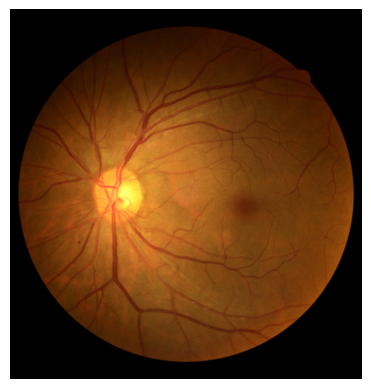

Image filename: ./diabetic-retinopathy-classification/Test/Test/Test_1.jpg
True Label: 1 
Predicted Label: 1


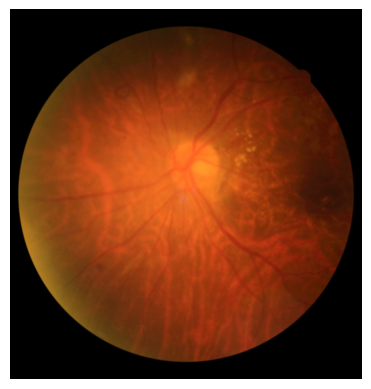

Image filename: ./diabetic-retinopathy-classification/Test/Test/Test_2.jpg
True Label: 3 
Predicted Label: 1


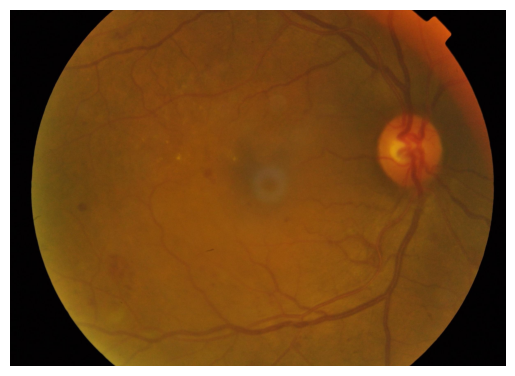

Image filename: ./diabetic-retinopathy-classification/Test/Test/Test_3.jpg
True Label: 1 
Predicted Label: 1


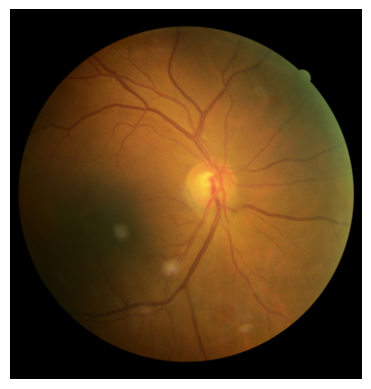

Image filename: ./diabetic-retinopathy-classification/Test/Test/Test_4.jpg
True Label: 0 
Predicted Label: 1


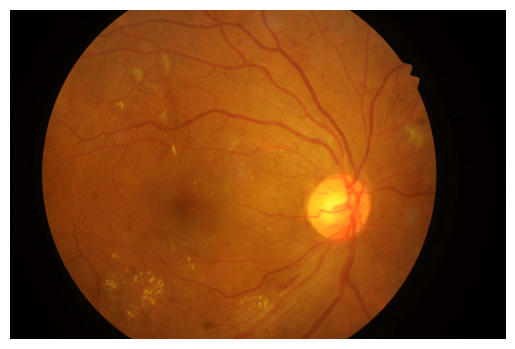

Image filename: ./diabetic-retinopathy-classification/Test/Test/Test_5.jpg
True Label: 3 
Predicted Label: 2


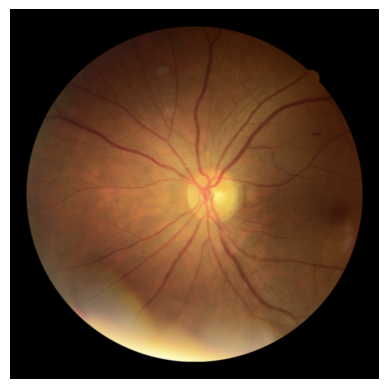

Image filename: ./diabetic-retinopathy-classification/Test/Test/Test_6.jpg
True Label: 1 
Predicted Label: 2


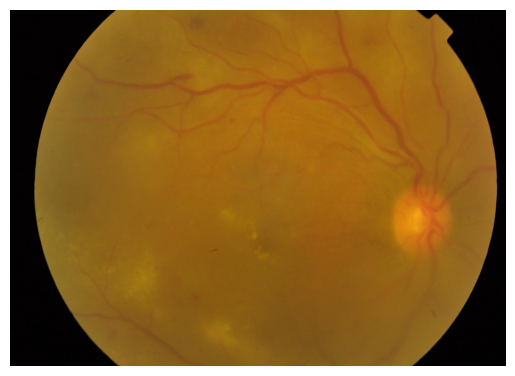

Image filename: ./diabetic-retinopathy-classification/Test/Test/Test_7.jpg
True Label: 2 
Predicted Label: 1


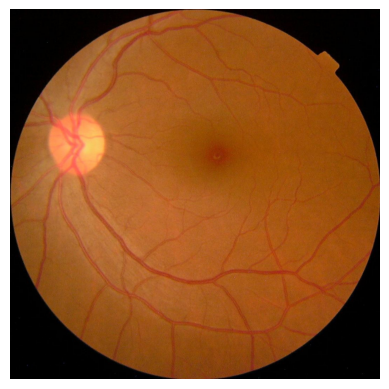

Image filename: ./diabetic-retinopathy-classification/Test/Test/Test_8.jpg
True Label: 0 
Predicted Label: 0


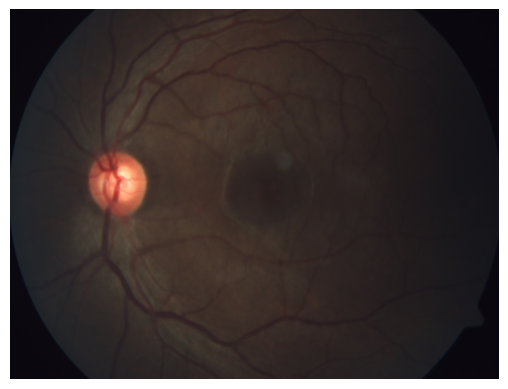

Image filename: ./diabetic-retinopathy-classification/Test/Test/Test_9.jpg
True Label: 0 
Predicted Label: 0


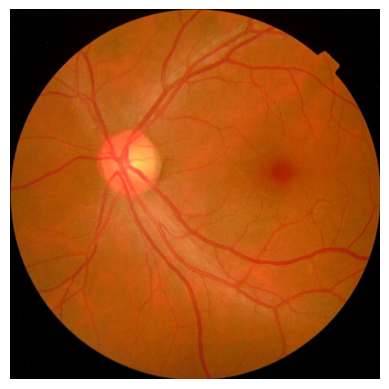

Image filename: ./diabetic-retinopathy-classification/Test/Test/Test_10.jpg
True Label: 0 
Predicted Label: 0


In [ ]:
gbctrue_labels, gbcpredicted_labels = EvalModel(gbpredict_image, gb_classifier)
print("========= GradientBoostingClassifier Train Accuracy =========")
DisplayTestEvaluation(gbctrue_labels, gbcpredicted_labels)

## Random Forest Model

In [ ]:
# Initialize Random Forest Classifier
rf_classifier = RandomForestClassifier(n_estimators=100)
rf_classifier.fit(X, y)

RandomForestClassifier()

In [ ]:
# Define the function to predict an image
def rf_predict_image(image_path, classifier):
    # Read the image
    img = cv2.imread(image_path)
    if img is not None:
        # Resize and preprocess the image
        resized_img = cv2.resize(img, (512, 512))  # Ensure the size matches the training setup
        median_filtered_image = ApplyMedianFilter(resized_img)
        clahe_image = ApplyCLAHE(median_filtered_image)

        # Extract features
        features_array = GetFeatures(clahe_image)

        # Convert to DataFrame with appropriate feature names
        features_df = pd.DataFrame([features_array], columns=feature_names)

        # Make prediction using the Random Forest classifier
        prediction = classifier.predict(features_df)

        # Return the prediction
        return prediction[0]
    else:
        return "Image could not be loaded"

In [ ]:
print("========= Random Forest Train Accuracy =========")
DisplayTrainEvaluation(rf_classifier)

========= Random Forest Train Accuracy =========
Accuracy: 95.205 +-(0.611)


========= Random Forest Test Accuracy =========
Accuracy: 68.14024390243902 %
Classification Report:
               precision    recall  f1-score   support

           0       0.87      0.91      0.89       938
           1       0.44      0.40      0.42       197
           2       0.55      0.65      0.60       514
           3       0.34      0.31      0.33       167
           4       0.37      0.12      0.18       152

    accuracy                           0.68      1968
   macro avg       0.51      0.48      0.48      1968
weighted avg       0.66      0.68      0.67      1968



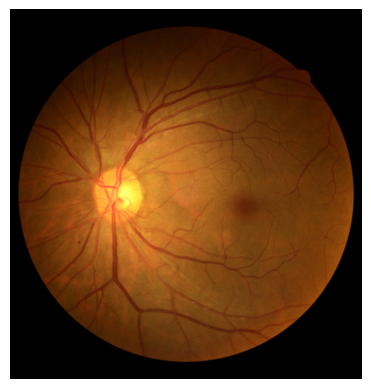

Image filename: ./diabetic-retinopathy-classification/Test/Test/Test_1.jpg
True Label: 1 
Predicted Label: 0


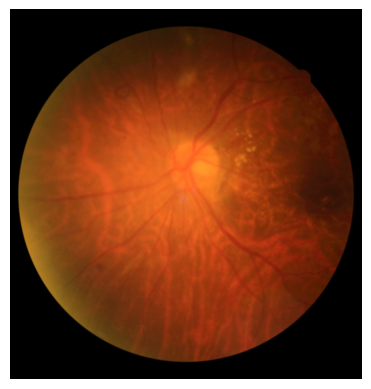

Image filename: ./diabetic-retinopathy-classification/Test/Test/Test_2.jpg
True Label: 3 
Predicted Label: 3


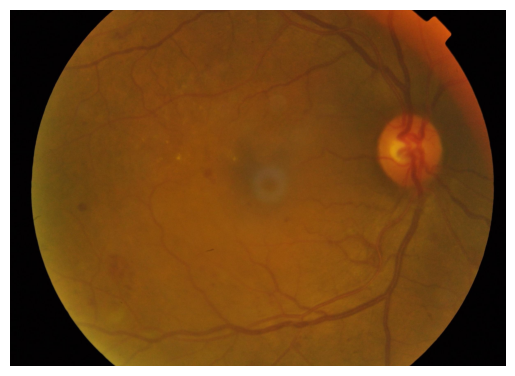

Image filename: ./diabetic-retinopathy-classification/Test/Test/Test_3.jpg
True Label: 1 
Predicted Label: 1


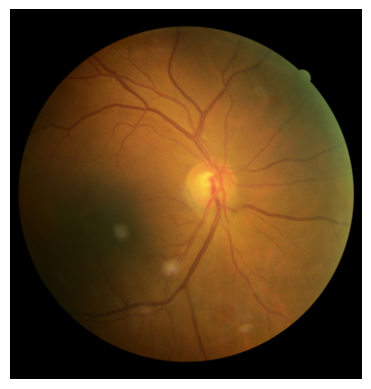

Image filename: ./diabetic-retinopathy-classification/Test/Test/Test_4.jpg
True Label: 0 
Predicted Label: 1


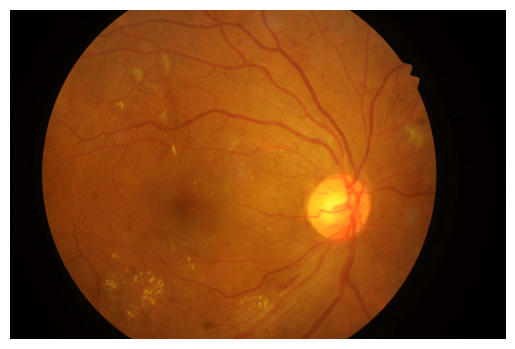

Image filename: ./diabetic-retinopathy-classification/Test/Test/Test_5.jpg
True Label: 3 
Predicted Label: 3


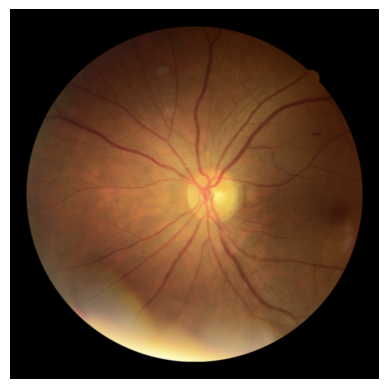

Image filename: ./diabetic-retinopathy-classification/Test/Test/Test_6.jpg
True Label: 1 
Predicted Label: 2


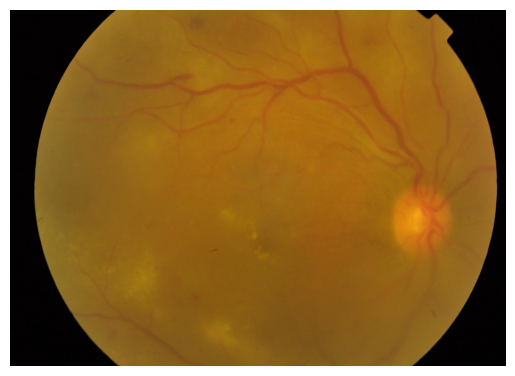

Image filename: ./diabetic-retinopathy-classification/Test/Test/Test_7.jpg
True Label: 2 
Predicted Label: 2


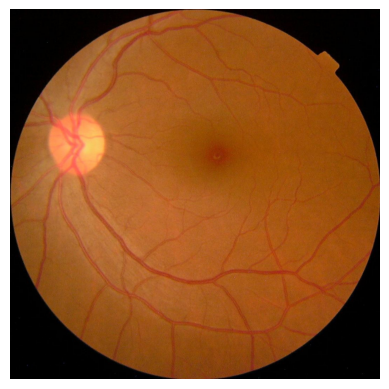

Image filename: ./diabetic-retinopathy-classification/Test/Test/Test_8.jpg
True Label: 0 
Predicted Label: 0


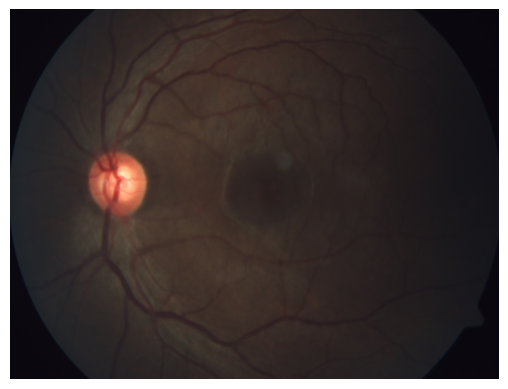

Image filename: ./diabetic-retinopathy-classification/Test/Test/Test_9.jpg
True Label: 0 
Predicted Label: 0


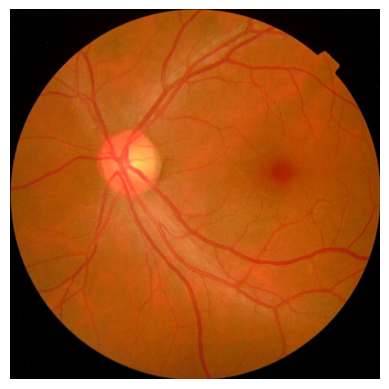

Image filename: ./diabetic-retinopathy-classification/Test/Test/Test_10.jpg
True Label: 0 
Predicted Label: 0


In [ ]:
rf_true_labels, rf_predicted_labels = EvalModel(rf_predict_image, rf_classifier)
print("========= Random Forest Test Accuracy =========")
DisplayTestEvaluation(rf_true_labels, rf_predicted_labels)

## KNN Model

In [ ]:
# Initialize K-Nearest Neighbors Classifier
knn_classifier = KNeighborsClassifier(n_neighbors=1)
knn_classifier.fit(X, y)

KNeighborsClassifier(n_neighbors=1)

In [ ]:
def knn_predict_image(image_path, classifier):
    # Read the image
    img = cv2.imread(image_path)
    if img is not None:
        # Resize and preprocess the image
        resized_img = cv2.resize(img, (512, 512))  # Ensure the size matches the training setup
        median_filtered_image = ApplyMedianFilter(resized_img)
        clahe_image = ApplyCLAHE(median_filtered_image)

        # Extract features
        features_array = GetFeatures(clahe_image)

        # Convert to DataFrame with appropriate feature names
        features_df = pd.DataFrame([features_array], columns=feature_names)

        # Make prediction using the KNN classifier
        prediction = classifier.predict(features_df)

        # Return the prediction
        return prediction[0]
    else:
        return "Image could not be loaded"

In [ ]:
# Define the feature names to be used during model training
feature_names = [
    'Lesions', 'Vessels',
    'Texture_Contrast_0', 'Texture_Dissimilarity_0', 'Texture_Homogeneity_0', 'Texture_Energy_0', 'Texture_Correlation_0',
    'Texture_Contrast_1', 'Texture_Dissimilarity_1', 'Texture_Homogeneity_1', 'Texture_Energy_1', 'Texture_Correlation_1',
    'Texture_Contrast_2', 'Texture_Dissimilarity_2', 'Texture_Homogeneity_2', 'Texture_Energy_2', 'Texture_Correlation_2',
    'Texture_Contrast_3', 'Texture_Dissimilarity_3', 'Texture_Homogeneity_3', 'Texture_Energy_3', 'Texture_Correlation_3',
    'Mean_Red', 'Mean_Green', 'Mean_Blue', 'Std_Red', 'Std_Green', 'Std_Blue'
]

# Add histogram feature names with correct naming convention
hist_red_feature_names = [f'Red_Hist_{i}' for i in range(256)]
hist_green_feature_names = [f'Green_Hist_{i}' for i in range(256)]
hist_blue_feature_names = [f'Blue_Hist_{i}' for i in range(256)]
histogram_feature_names = hist_red_feature_names + hist_green_feature_names + hist_blue_feature_names
feature_names += histogram_feature_names

In [ ]:
print("========= KNN Train Accuracy =========")
DisplayTrainEvaluation(knn_classifier)

========= KNN Train Accuracy =========
Accuracy: 93.409 +-(0.647)


========= KNN Test Accuracy =========
Accuracy: 61.33130081300813 %
Classification Report:
               precision    recall  f1-score   support

           0       0.86      0.85      0.85       938
           1       0.31      0.37      0.34       197
           2       0.56      0.50      0.53       514
           3       0.27      0.29      0.28       167
           4       0.19      0.22      0.20       152

    accuracy                           0.61      1968
   macro avg       0.44      0.44      0.44      1968
weighted avg       0.62      0.61      0.62      1968



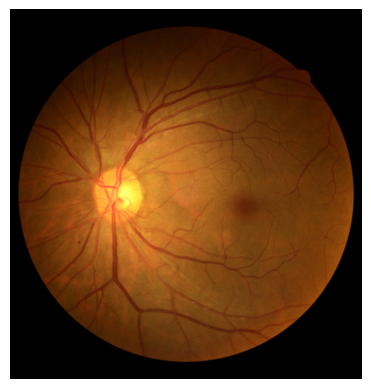

Image filename: ./diabetic-retinopathy-classification/Test/Test/Test_1.jpg
True Label: 1 
Predicted Label: 2


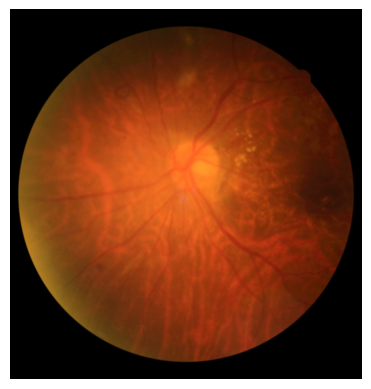

Image filename: ./diabetic-retinopathy-classification/Test/Test/Test_2.jpg
True Label: 3 
Predicted Label: 0


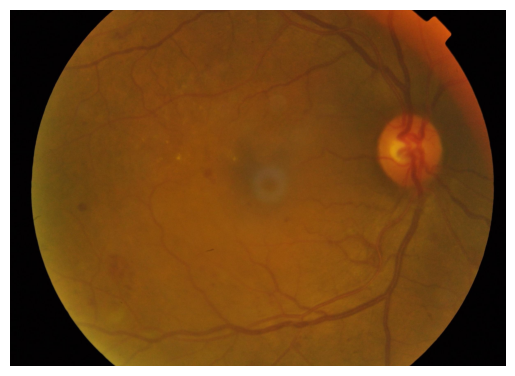

Image filename: ./diabetic-retinopathy-classification/Test/Test/Test_3.jpg
True Label: 1 
Predicted Label: 2


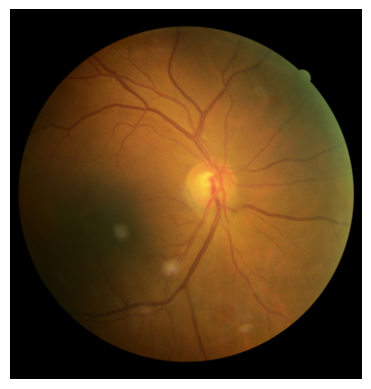

Image filename: ./diabetic-retinopathy-classification/Test/Test/Test_4.jpg
True Label: 0 
Predicted Label: 1


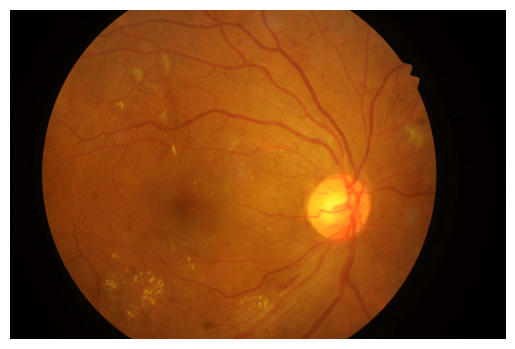

Image filename: ./diabetic-retinopathy-classification/Test/Test/Test_5.jpg
True Label: 3 
Predicted Label: 4


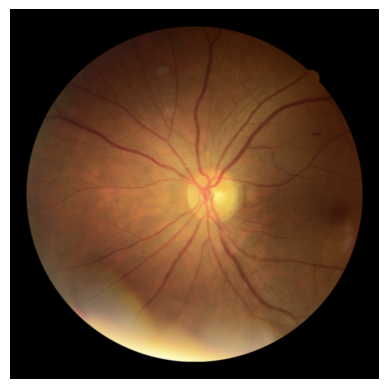

Image filename: ./diabetic-retinopathy-classification/Test/Test/Test_6.jpg
True Label: 1 
Predicted Label: 2


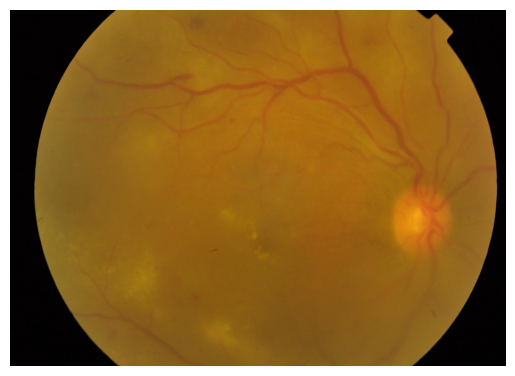

Image filename: ./diabetic-retinopathy-classification/Test/Test/Test_7.jpg
True Label: 2 
Predicted Label: 2


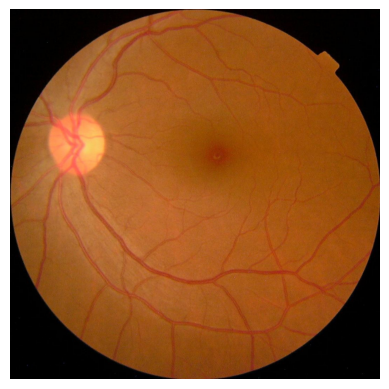

Image filename: ./diabetic-retinopathy-classification/Test/Test/Test_8.jpg
True Label: 0 
Predicted Label: 0


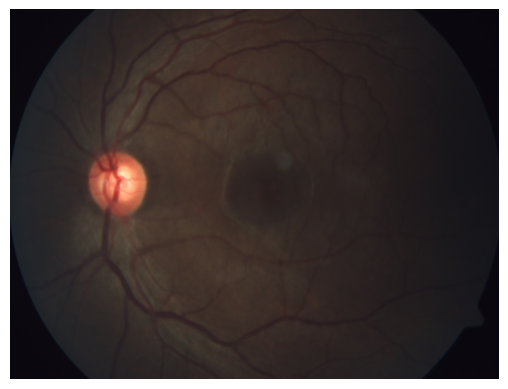

Image filename: ./diabetic-retinopathy-classification/Test/Test/Test_9.jpg
True Label: 0 
Predicted Label: 0


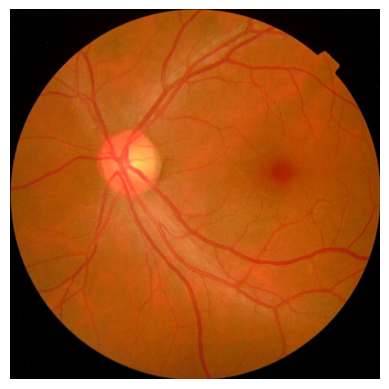

Image filename: ./diabetic-retinopathy-classification/Test/Test/Test_10.jpg
True Label: 0 
Predicted Label: 0


In [ ]:
knn_true_labels, knn_predicted_labels = EvalModel(knn_predict_image, knn_classifier)
print("========= KNN Test Accuracy =========")
DisplayTestEvaluation(knn_true_labels, knn_predicted_labels)

# **Deep Learning**

In [ ]:
import os
import cv2
import csv
import shutil
import pickle
import multiprocessing
import seaborn as sns
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import tensorflow as tf

from glob import glob
from PIL import Image
from tqdm.autonotebook import tqdm
from prettytable import PrettyTable
from functools import partial
from multiprocessing.pool import ThreadPool
from imblearn.over_sampling import SMOTE
from sklearn.manifold import TSNE
from sklearn.utils import class_weight
from sklearn.metrics import confusion_matrix, cohen_kappa_score, accuracy_score
from sklearn.model_selection import cross_val_predict, train_test_split
from keras import applications, Model, optimizers
from keras import backend as K
from keras.layers import Input, GlobalAveragePooling2D, Dropout, Dense, Activation
from keras.preprocessing.image import img_to_array, array_to_img, load_img, ImageDataGenerator
from keras.callbacks import EarlyStopping, ReduceLROnPlateau

<ipython-input-1-5e40367f1b66>:15: TqdmExperimentalWarning: Using `tqdm.autonotebook.tqdm` in notebook mode. Use `tqdm.tqdm` instead to force console mode (e.g. in jupyter console)
  from tqdm.autonotebook import tqdm


In [ ]:
from google.colab import drive
drive.mount('/content/drive/')

Drive already mounted at /content/drive/; to attempt to forcibly remount, call drive.mount("/content/drive/", force_remount=True).


In [ ]:
path_drive = '/content/drive/MyDrive/Colab Notebooks/diabetic-retinopathy-classification.zip'

!unzip "$path_drive"

Archive:  /content/drive/MyDrive/Colab Notebooks/diabetic-retinopathy-classification.zip
replace __MACOSX/._diabetic-retinopathy-classification? [y]es, [n]o, [A]ll, [N]one, [r]ename: 

In [ ]:
BASE_PATH = os.path.join('.', 'diabetic-retinopathy-classification')
TRAIN_CSV_PATH = os.path.join(BASE_PATH, 'Train.csv')
TEST_CSV_PATH = os.path.join(BASE_PATH, 'test.csv')
N_THREAD = int(multiprocessing.cpu_count())
IMG_SIZE = 256

## Visualization of Image

In [ ]:
def GenerateRetinaDf(csv_path, folder):
  retina_df = pd.read_csv(csv_path)
  retina_df['path'] = retina_df['id_code'].map(lambda x: os.path.join(BASE_PATH, folder, folder, '{}.jpg'.format(x)))
  retina_df['exists'] = retina_df['path'].map(os.path.exists)
  retina_df['filename'] = retina_df['id_code'].map(lambda x: '{}.jpg'.format(x))
  retina_df.dropna(inplace = True)
  retina_df = retina_df[retina_df['exists']]
  return retina_df.drop(['exists'], axis=1)

In [ ]:
train_retina_df = GenerateRetinaDf(TRAIN_CSV_PATH, "Train")
test_retina_df = GenerateRetinaDf(TEST_CSV_PATH, "Test")
test_retina_df = test_retina_df.drop(columns=['Usage'])
print(f"train shape: {train_retina_df.shape} test shape: {test_retina_df.shape}")
train_retina_df.head()

train shape: (4209, 4) test shape: (1968, 4)


,id_code,diagnosis,path,filename
0,Train_1,2,./diabetic-retinopathy-classification/Train/Tr...,Train_1.jpg
1,Train_2,2,./diabetic-retinopathy-classification/Train/Tr...,Train_2.jpg
2,Train_3,4,./diabetic-retinopathy-classification/Train/Tr...,Train_3.jpg
3,Train_4,2,./diabetic-retinopathy-classification/Train/Tr...,Train_4.jpg
4,Train_5,3,./diabetic-retinopathy-classification/Train/Tr...,Train_5.jpg


In [ ]:
def PlotClasses(df, title):
  df_group = pd.DataFrame(df.groupby('diagnosis').agg('size').reset_index())
  df_group.columns = ['diagnosis','count']

  sns.set(rc={'figure.figsize':(5, 2.5)}, style = 'whitegrid')
  sns.barplot(x = 'diagnosis',y='count',data = df_group,palette = "Blues_d")
  plt.title('Output Class Distribution ' + str(title))
  plt.show()

def ConvGray(img):
  img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
  img = cv2.resize(img, (IMG_SIZE, IMG_SIZE))
  return img

def TSNEVisualization():
  npix = 224 # resize to npix x npix (for now)
  X_train = np.zeros((train_retina_df.shape[0], npix, npix))
  for i in tqdm(range(train_retina_df.shape[0])):
    # load an image
    img = cv2.imread(train_retina_df['path'].iloc[i])
    img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    X_train[i, :, :] = cv2.resize(img, (npix, npix))
  # normalize
  X = X_train / 255

  # reshape
  X = X.reshape(X.shape[0], -1)
  trainy = train_retina_df['diagnosis']

  per_vals = [2,5,10,15,20,30,40,50]
  for per in tqdm(per_vals):
    X_decomposed = TSNE(n_components=2,perplexity = per).fit_transform(X)
    df_tsne = pd.DataFrame(data=X_decomposed, columns=['Dimension_x','Dimension_y'])
    df_tsne['Score'] = trainy.values

    sns.FacetGrid(df_tsne, hue='Score' ).map(plt.scatter, 'Dimension_x', 'Dimension_y').add_legend()
    plt.title('TSNE for perplexity = ' + str(per))
    plt.show()

def VisualizeImgs(df, pts_per_class, color_scale):
  df = df.groupby('diagnosis', group_keys = False).apply(lambda df: df.sample(pts_per_class))
  df = df.reset_index(drop = True)

  plt.rcParams["axes.grid"] = False
  for pt in range(pts_per_class):
    f, axarr = plt.subplots(1,5,figsize = (15,15))
    axarr[0].set_ylabel("Sample Data Points")
    df_temp = df[df.index.isin([pt + (pts_per_class*0),pt + (pts_per_class*1), pt + (pts_per_class*2),pt + (pts_per_class*3),pt + (pts_per_class*4)])]
    for i in range(5):
      if color_scale == 'gray':
        img = ConvGray(cv2.imread(df_temp['path'].iloc[i]))
        axarr[i].imshow(img,cmap = color_scale)
      else:
        axarr[i].imshow(Image.open(df_temp['path'].iloc[i]).resize((IMG_SIZE, IMG_SIZE)))
      axarr[i].set_xlabel('Class '+str(df_temp['diagnosis'].iloc[i]))

    plt.show()

<ipython-input-7-337c6d98fe05>:6: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x = 'diagnosis',y='count',data = df_group,palette = "Blues_d")


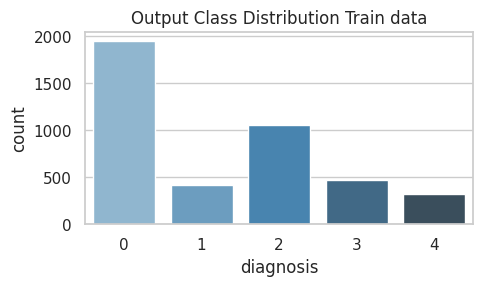

In [ ]:
PlotClasses(train_retina_df, "Train data")

<ipython-input-7-337c6d98fe05>:6: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x = 'diagnosis',y='count',data = df_group,palette = "Blues_d")


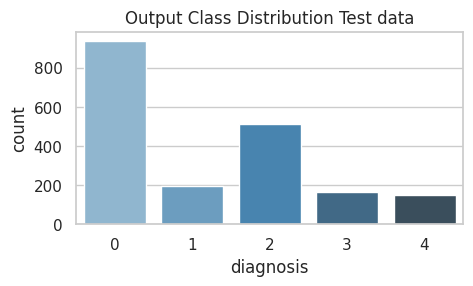

In [ ]:
PlotClasses(test_retina_df, "Test data")

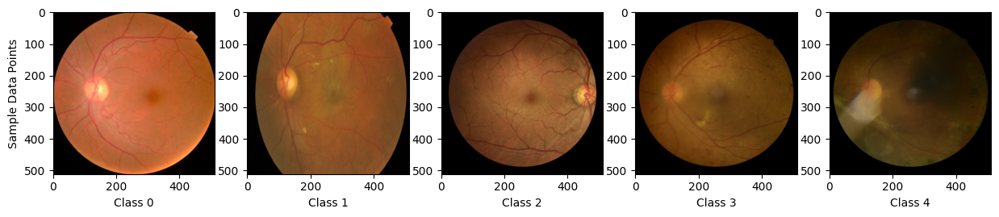

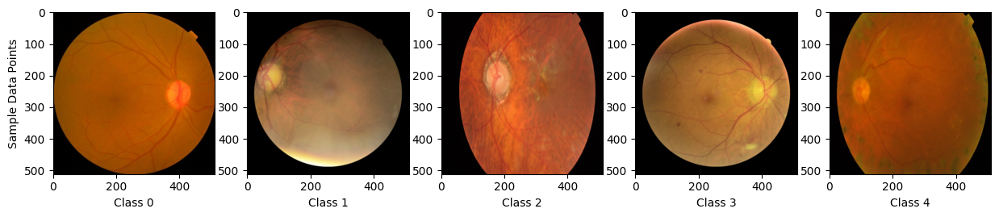

In [ ]:
VisualizeImgs(train_retina_df, 2, color_scale = None)

  0%|          | 0/4209 [00:00<?, ?it/s]

  0%|          | 0/8 [00:00<?, ?it/s]

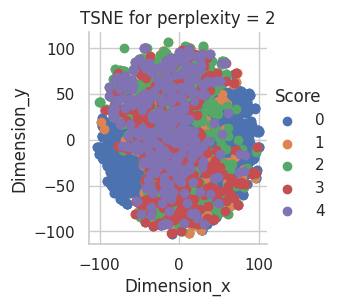

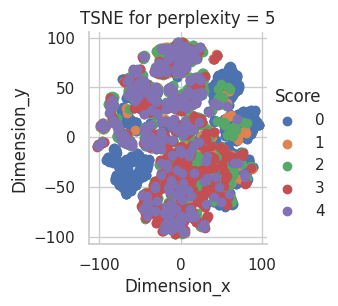

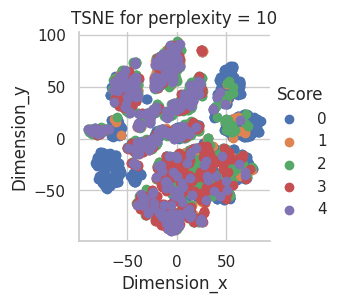

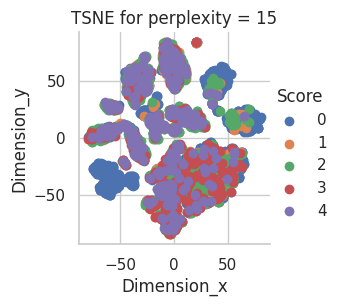

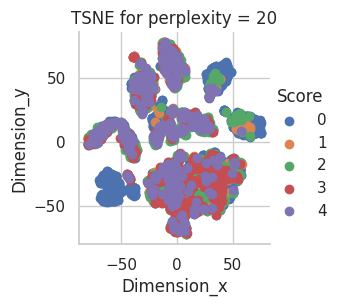

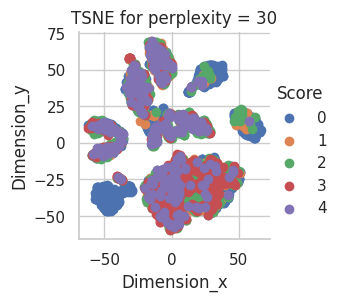

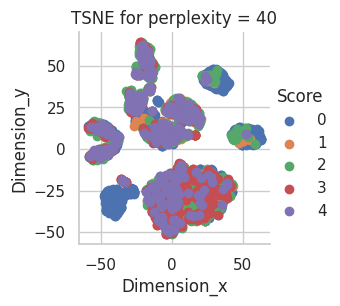

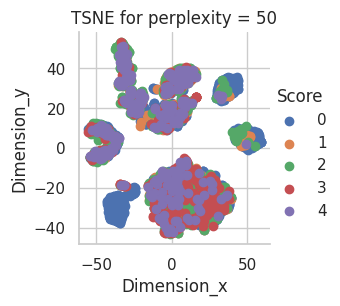

In [ ]:
TSNEVisualization()

## Image Processing

In [ ]:
def CropImageFromGray(img,tol=7):
  if img.ndim ==2:
    mask = img>tol
    return img[np.ix_(mask.any(1),mask.any(0))]
  elif img.ndim==3:
    gray_img = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    mask = gray_img>tol

    check_shape = img[:,:,0][np.ix_(mask.any(1),mask.any(0))].shape[0]
    if (check_shape == 0): # image is too dark so that we crop out everything,
      return img # return original image
    else:
      img1=img[:,:,0][np.ix_(mask.any(1),mask.any(0))]
      img2=img[:,:,1][np.ix_(mask.any(1),mask.any(0))]
      img3=img[:,:,2][np.ix_(mask.any(1),mask.any(0))]
      # print(img1.shape,img2.shape,img3.shape)
      img = np.stack([img1,img2,img3],axis=-1)
      # print(img.shape)
    return img

def CircleCrop(img, sigmaX=30):
  img = CropImageFromGray(img)
  img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

  height, width, depth = img.shape

  x = int(width/2)
  y = int(height/2)
  r = np.amin((x,y))

  circle_img = np.zeros((height, width), np.uint8)
  cv2.circle(circle_img, (x,y), int(r), 1, thickness=-1)
  img = cv2.bitwise_and(img, img, mask=circle_img)
  img = CropImageFromGray(img)
  img=cv2.addWeighted(img,4, cv2.GaussianBlur( img , (0,0) , sigmaX) ,-4 ,128)
  return img

def DisplayGaussianExample(img):
  img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
  img = cv2.resize(img, (IMG_SIZE, IMG_SIZE))
  img_t = cv2.addWeighted(img, 4, cv2.GaussianBlur(img, (0, 0), 30), -4, 128)
  f, axarr = plt.subplots(1, 2, figsize = (6, 6))
  axarr[0].imshow(img)
  axarr[1].imshow(img_t)
  plt.title('After applying Gaussian Blur')
  plt.show()

def DisplayCropGaussianExample(img):
  img_t = CircleCrop(img,sigmaX = 30)
  f, axarr = plt.subplots(1,2,figsize = (6, 6))
  axarr[0].imshow(cv2.resize(cv2.cvtColor(img, cv2.COLOR_BGR2RGB),(IMG_SIZE,IMG_SIZE)))
  axarr[1].imshow(img_t)
  plt.title('After applying Circular Crop and Gaussian Blur')
  plt.show()

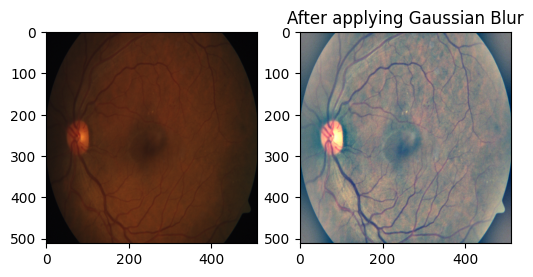

In [ ]:
rn = np.random.randint(low = 0,high = len(train_retina_df) - 1)
img = cv2.imread(train_retina_df['path'].iloc[rn])

DisplayGaussianExample(img)

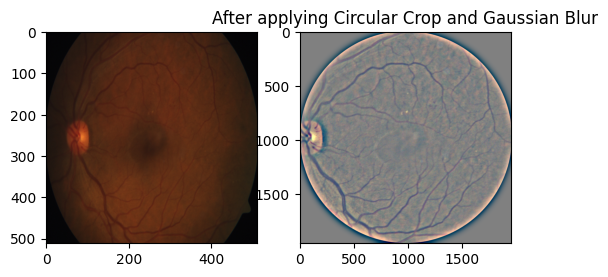

In [ ]:
DisplayCropGaussianExample(img)

## Train Validation Split

In [ ]:
df_train_train, df_train_valid = train_test_split(train_retina_df, test_size = 0.2)
print(f"train shape: {df_train_train.shape} validation shape: {df_train_valid.shape}")

train shape: (3367, 4) validation shape: (842, 4)


<ipython-input-8-337c6d98fe05>:6: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x = 'diagnosis',y='count',data = df_group,palette = "Blues_d")


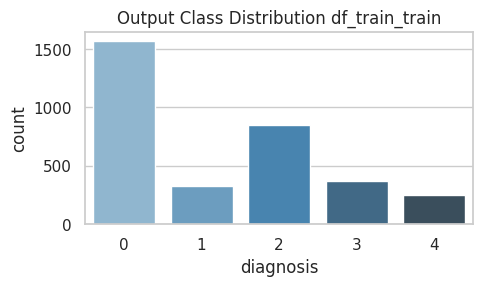

In [ ]:
PlotClasses(df_train_train, "df_train_train")

<ipython-input-8-337c6d98fe05>:6: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x = 'diagnosis',y='count',data = df_group,palette = "Blues_d")


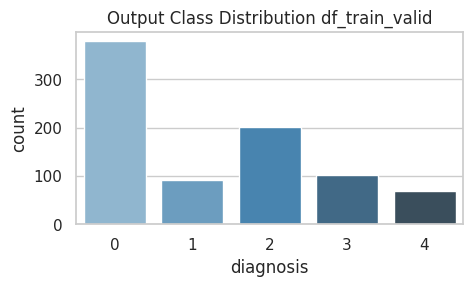

In [ ]:
PlotClasses(df_train_valid, "df_train_valid")

## Resize and Preprocessing => Save Image

In [ ]:
def CreateFolderRemoveIfExist(path):
  if os.path.exists(path):
    shutil.rmtree(path)
  os.makedirs(path)

def Multiprocess(func, process:int, imgs:list, input_root_path:str, output_root_path:str):
  CreateFolderRemoveIfExist(output_root_path)
  print(f'MESSAGE: Running {process} process')
  partial_func = partial(func, input_root_path=input_root_path, output_root_path=output_root_path)
  ThreadPool(process).map(partial_func, imgs)

def ImageResizeSave(file, input_root_path, output_root_path):
  input_filepath = os.path.join(input_root_path,'{}.jpg'.format(file))
  output_filepath = os.path.join(output_root_path,'{}.jpg'.format(file))
  img = cv2.imread(input_filepath)
  cv2.imwrite(output_filepath, cv2.resize(img, (IMG_SIZE, IMG_SIZE)))

def PreprocessImage(file, input_root_path, output_root_path):
  input_filepath = os.path.join(input_root_path,'{}.jpg'.format(file))
  output_filepath = os.path.join(output_root_path,'{}.jpg'.format(file))
  img = cv2.imread(input_filepath)
  img = CircleCrop(img)
  cv2.imwrite(output_filepath, cv2.resize(img, (IMG_SIZE, IMG_SIZE)))

def ResizeAndSaveImageProcess():
  TRAIN_ROOT_INPUT_PATH = os.path.join(BASE_PATH, 'Train', 'Train')
  VALID_ROOT_INPUT_PATH = os.path.join(BASE_PATH, 'Train', 'Train')
  TEST_ROOT_INPUT_PATH = os.path.join(BASE_PATH, 'Test', 'Test')
  TRAIN_TARGET_FOLDER = 'train_images_resized'
  VALID_TARGET_FOLDER = 'valid_images_resized'
  TEST_TARGET_FOLDER = 'test_images_resized'
  Multiprocess(ImageResizeSave, N_THREAD, list(df_train_train['id_code'].values), TRAIN_ROOT_INPUT_PATH, TRAIN_TARGET_FOLDER)
  Multiprocess(ImageResizeSave, N_THREAD, list(df_train_valid['id_code'].values), VALID_ROOT_INPUT_PATH, VALID_TARGET_FOLDER)
  Multiprocess(ImageResizeSave, N_THREAD, list(test_retina_df['id_code'].values), TEST_ROOT_INPUT_PATH, TEST_TARGET_FOLDER)

def PreprocessImageProcess():
  TRAIN_ROOT_INPUT_PATH = 'train_images_resized'
  VALID_ROOT_INPUT_PATH = 'valid_images_resized'
  TEST_ROOT_INPUT_PATH = 'test_images_resized'
  TRAIN_TARGET_FOLDER = 'train_images_resized_preprocessed'
  VALID_TARGET_FOLDER = 'valid_images_resized_preprocessed'
  TEST_TARGET_FOLDER = 'test_images_resized_preprocessed'
  Multiprocess(PreprocessImage, N_THREAD, list(df_train_train['id_code'].values), TRAIN_ROOT_INPUT_PATH, TRAIN_TARGET_FOLDER)
  Multiprocess(PreprocessImage, N_THREAD, list(df_train_valid['id_code'].values), VALID_ROOT_INPUT_PATH, VALID_TARGET_FOLDER)
  Multiprocess(PreprocessImage, N_THREAD, list(test_retina_df['id_code'].values), TEST_ROOT_INPUT_PATH, TEST_TARGET_FOLDER)

In [ ]:
ResizeAndSaveImageProcess()
PreprocessImageProcess()

MESSAGE: Running 16 process
MESSAGE: Running 16 process
MESSAGE: Running 16 process
MESSAGE: Running 16 process
MESSAGE: Running 16 process
MESSAGE: Running 16 process


## Model parametors

In [ ]:
# Model parameters
BATCH_SIZE = 8
EPOCHS = 30
WARMUP_EPOCHS = 2
LEARNING_RATE = 1e-4
WARMUP_LEARNING_RATE = 1e-3
HEIGHT = IMG_SIZE
WIDTH = IMG_SIZE
CHANNAL = 3
N_CLASSES = df_train_train['diagnosis'].nunique()
ES_PATIENCE = 5
RLROP_PATIENCE = 3
DECAY_DROP = 0.5

In [ ]:
def Kappa(y_true, y_pred, n_classes=5):
  y_trues = K.cast(K.argmax(y_true), K.floatx())
  y_preds = K.cast(K.argmax(y_pred), K.floatx())
  n_samples = K.cast(K.shape(y_true)[0], K.floatx())
  distance = K.sum(K.abs(y_trues - y_preds))
  max_distance = n_classes - 1
  kappa_score = 1 - ((distance**2) / (n_samples * (max_distance**2)))
  return kappa_score

## Data generator

In [ ]:
def ImgGenerator(train_df, valid_df, test_df):
  train_df['diagnosis'] = train_df['diagnosis'].astype(str)
  valid_df['diagnosis'] = valid_df['diagnosis'].astype(str)
  test_df['diagnosis'] = test_df['diagnosis'].astype(str)

  # datagen=ImageDataGenerator(rescale=1./255,
  #                          rotation_range=360,
  #                          horizontal_flip=True,
  #                          vertical_flip=True)

  train_datagen = ImageDataGenerator(rescale=1./255, horizontal_flip=True)
  train_generator = train_datagen.flow_from_dataframe(dataframe=train_df,
                                                      directory="./train_images_resized_preprocessed/",
                                                      x_col="filename",
                                                      y_col="diagnosis",
                                                      batch_size=BATCH_SIZE,
                                                      class_mode="categorical",
                                                      target_size=(HEIGHT, WIDTH),
                                                      )

  valid_generator = train_datagen.flow_from_dataframe(dataframe=valid_df,
                                                      directory="./valid_images_resized_preprocessed/",
                                                      x_col="filename",
                                                      y_col="diagnosis",
                                                      batch_size=BATCH_SIZE,
                                                      class_mode="categorical",
                                                      target_size=(HEIGHT, WIDTH),
                                                      )

  test_datagen = ImageDataGenerator(rescale=1./255)
  test_generator = test_datagen.flow_from_dataframe(dataframe=test_df,
                                                    directory = "./test_images_resized_preprocessed/",
                                                    x_col="filename",
                                                    batch_size=1,
                                                    class_mode=None,
                                                    target_size=(HEIGHT, WIDTH),
                                                    shuffle=False)
  return train_generator, valid_generator, test_generator

In [ ]:
train_generator, valid_generator, test_generator = ImgGenerator(df_train_train, df_train_valid, test_retina_df)
STEP_SIZE_TRAIN = train_generator.n // train_generator.batch_size
STEP_SIZE_VALID = valid_generator.n // valid_generator.batch_size
print(f"step size train: {STEP_SIZE_TRAIN}, step size validation: {STEP_SIZE_VALID}")

Found 3367 validated image filenames belonging to 5 classes.
Found 842 validated image filenames belonging to 5 classes.
Found 1968 validated image filenames.
step size train: 420, step size validation: 105


## SMOTE

<ipython-input-8-337c6d98fe05>:6: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x = 'diagnosis',y='count',data = df_group,palette = "Blues_d")


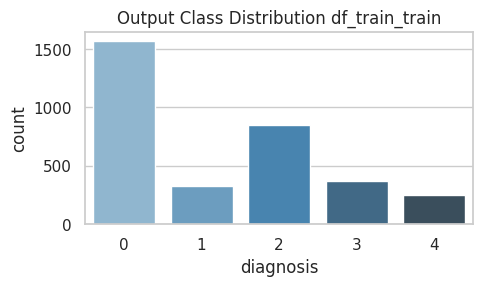

In [ ]:
PlotClasses(df_train_train, "df_train_train")

In [ ]:
generator = ImageDataGenerator().flow_from_dataframe(dataframe=df_train_train,
                                                    directory="./train_images_resized_preprocessed/",
                                                    x_col="filename",
                                                    y_col="diagnosis",
                                                    batch_size=BATCH_SIZE,
                                                    class_mode="categorical",
                                                    target_size=(HEIGHT, WIDTH),
                                                    )

Found 3367 validated image filenames belonging to 5 classes.


In [ ]:
x = np.concatenate([generator.next()[0] for i in range(generator.__len__())])
y = np.concatenate([generator.next()[1] for i in range(generator.__len__())])
print(x.shape)
print(y.shape)

(3367, 256, 256, 3)
(3367, 5)


In [ ]:
#Converting  our color images to a vector
X_train = x.reshape(x.shape[0], x.shape[1] * x.shape[2] * x.shape[3])
print(X_train.shape)

(3367, 196608)


In [ ]:
# split for save memory
X_smote_by_phase = [X_train[:500], X_train[500:1000], X_train[1000:1500], X_train[1500:2000], X_train[2000:2500], X_train[2500:3000], X_train[3000:]]
y_smote_by_phase = [y[:500], y[500:1000], y[1000:1500], y[1500:2000], y[2000:2500], y[2500:3000], y[3000:]]

In [ ]:
train_smote_list = []
file_number = 1;
folder_name = "train_smote"
CreateFolderRemoveIfExist(folder_name)

#Apply SMOTE method
for i in tqdm(range(len(X_smote_by_phase))):
  sm = SMOTE(random_state=2)
  X_smote, y_smote = sm.fit_resample(X_smote_by_phase[i], y_smote_by_phase[i])
  #Retrieve the image and save it to drive. Here's an example for a single image
  Xsmote_img = X_smote.reshape(X_smote.shape[0], x.shape[1], x.shape[2], x.shape[3])
  for i in range(Xsmote_img.shape[0]):
    class_label = y_smote[i].argmax(axis=-1)
    file_name = str(f"train_smote_{file_number}.jpg")
    file_path = os.path.join('.', folder_name, file_name)
    pil_img = array_to_img(Xsmote_img[i]* 255)
    pil_img.save(file_path)
    train_smote_list.append({'id_code': str(f"train_smote_{file_number}"), 'diagnosis': int(class_label), 'path': file_path, 'filename': file_name})
    file_number += 1

df_train_smote = pd.concat([pd.DataFrame(train_smote_list)], ignore_index=True)

  0%|          | 0/7 [00:00<?, ?it/s]

In [ ]:
df_train_smote.shape

(7845, 4)

<ipython-input-8-337c6d98fe05>:6: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x = 'diagnosis',y='count',data = df_group,palette = "Blues_d")


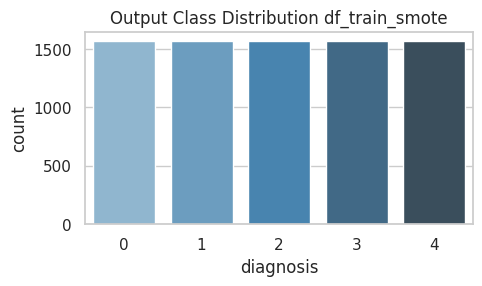

In [ ]:
PlotClasses(df_train_smote, "df_train_smote")

In [ ]:
df_train_smote['diagnosis'] = df_train_smote['diagnosis'].astype(str)
train_smote_generator = ImageDataGenerator(rescale=1./255, horizontal_flip=True).flow_from_dataframe(dataframe=df_train_smote,
                                                                                directory="./train_smote/",
                                                                                x_col="filename",
                                                                                y_col="diagnosis",
                                                                                batch_size=BATCH_SIZE,
                                                                                class_mode="categorical",
                                                                                target_size=(HEIGHT, WIDTH),
                                                                                )

Found 7845 validated image filenames belonging to 5 classes.


## Train Model

In [ ]:
def CreateModelResNet50(input_shape, n_out):
  input_tensor = Input(shape=input_shape)
  base_model = applications.ResNet50(weights='imagenet', include_top=False, input_tensor=input_tensor)

  x = GlobalAveragePooling2D()(base_model.output)
  x = Dropout(0.5)(x)
  x = Dense(2048, activation='relu')(x)
  x = Dropout(0.5)(x)
  final_output = Dense(n_out, activation='softmax', name='final_output')(x)
  model = Model(input_tensor, final_output)
  return model

def CreateModelInceptionV3(input_shape, n_out):
  input_tensor = Input(shape=input_shape)
  base_model = applications.InceptionV3(include_top=False, weights="imagenet", input_tensor=input_tensor)

  x = GlobalAveragePooling2D()(base_model.output)
  x = Dropout(0.5)(x)
  x = Dense(2048, activation='relu')(x)
  x = Dropout(0.5)(x)
  final_output = Dense(n_out, activation='softmax', name='final_output')(x)
  model = Model(input_tensor, final_output)
  return model

def CreateModelDenseNet169(input_shape, n_out):
  input_tensor = Input(shape=input_shape)
  base_model = applications.DenseNet169(include_top=False, weights="imagenet", input_tensor=input_tensor)
  # base_model.load_weights('densenet169_weights_tf_dim_ordering_tf_kernels_notop.h5')
  x = GlobalAveragePooling2D()(base_model.output)
  x = Dropout(0.5)(x)
  x = Dense(2048, activation='relu')(x)
  x = Dropout(0.5)(x)
  final_output = Dense(n_out, activation='softmax', name='final_output')(x)
  model = Model(input_tensor, final_output)
  return model


In [ ]:
# class_weights = class_weight.compute_class_weight(class_weight='balanced',
#                                                   classes=np.unique(df_train_train['diagnosis'].astype('int').values),
#                                                   y=df_train_train['diagnosis'].astype('int').values)

# metric_list = ["accuracy", Kappa]
metric_list = ["accuracy"]
# generator_for_train = train_generator
generator_for_train = train_smote_generator

def TrainTopLayers(model):
  for layer in model.layers:
    layer.trainable = False
  for i in range(-5, 0):
      model.layers[i].trainable = True
  model.compile(optimizer = optimizers.Adam(learning_rate = WARMUP_LEARNING_RATE), loss = 'categorical_crossentropy', metrics = metric_list)
  model.summary()

def FitTopLayers(model):
  return model.fit_generator(generator=generator_for_train,
                            steps_per_epoch=STEP_SIZE_TRAIN,
                            validation_data=valid_generator,
                            validation_steps=STEP_SIZE_VALID,
                            epochs=WARMUP_EPOCHS,
                            verbose=1).history

def FineTuneModel(model):
  for layer in model.layers:
    layer.trainable = True
  es = EarlyStopping(monitor='val_loss', mode='min', patience=ES_PATIENCE, restore_best_weights=True, verbose=1)
  rlrop = ReduceLROnPlateau(monitor='val_loss', mode='min', patience=RLROP_PATIENCE, factor=DECAY_DROP, min_lr=1e-6, verbose=1)
  optimizer = optimizers.Adam(learning_rate=LEARNING_RATE)
  model.compile(optimizer=optimizer, loss="binary_crossentropy",  metrics = metric_list)
  model.summary()
  return [es, rlrop]
  # return [rlrop]

def FitCompleteModel(model, callback_list):
  return model.fit_generator(generator=generator_for_train,
                            steps_per_epoch=STEP_SIZE_TRAIN,
                            validation_data=valid_generator,
                            validation_steps=STEP_SIZE_VALID,
                            epochs=EPOCHS,
                            callbacks=callback_list,
                            verbose=1).history

def PlotGraph(history_warmup, history_finetunning):
  history = {'loss': history_warmup['loss'] + history_finetunning['loss'],
           'val_loss': history_warmup['val_loss'] + history_finetunning['val_loss'],
           'acc': history_warmup['accuracy'] + history_finetunning['accuracy'],
           'val_acc': history_warmup['val_accuracy'] + history_finetunning['val_accuracy'],
           }

  sns.set_style("whitegrid")
  fig, (ax1, ax2) = plt.subplots(2, 1, sharex='col', figsize=(10, 9))
  ax1.plot(history['loss'], label='Train loss')
  ax1.plot(history['val_loss'], label='Validation loss')
  ax1.legend(loc='best')
  ax1.set_title('Loss')

  ax2.plot(history['acc'], label='Train accuracy')
  ax2.plot(history['val_acc'], label='Validation accuracy')
  ax2.legend(loc='best')
  ax2.set_title('Accuracy')

  plt.xlabel('Epochs')
  sns.despine()
  plt.show()

## ResNet50 Model

In [ ]:
model_RN50_3 = CreateModelResNet50(input_shape=(HEIGHT, WIDTH, CHANNAL), n_out=N_CLASSES)
TrainTopLayers(model_RN50_3)

Model: "model_3"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_4 (InputLayer)        [(None, 256, 256, 3)]        0         []                            
                                                                                                  
 conv1_pad (ZeroPadding2D)   (None, 262, 262, 3)          0         ['input_4[0][0]']             
                                                                                                  
 conv1_conv (Conv2D)         (None, 128, 128, 64)         9472      ['conv1_pad[0][0]']           
                                                                                                  
 conv1_bn (BatchNormalizati  (None, 128, 128, 64)         256       ['conv1_conv[0][0]']          
 on)                                                                                        

In [ ]:
history_warmup_RN50_1 = FitTopLayers(model_RN50_3)

Epoch 1/2


<ipython-input-91-6536cf3e8db0>:19: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  return model.fit_generator(generator=generator_for_train,


420/420 [==============================] - 17s 30ms/step - loss: 2.1030 - accuracy: 0.1948 - val_loss: 1.5960 - val_accuracy: 0.1226
Epoch 2/2
420/420 [==============================] - 11s 25ms/step - loss: 1.6615 - accuracy: 0.2134 - val_loss: 1.5356 - val_accuracy: 0.4500


In [ ]:
callback_list = FineTuneModel(model_RN50_3)

Model: "model_3"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_4 (InputLayer)        [(None, 256, 256, 3)]        0         []                            
                                                                                                  
 conv1_pad (ZeroPadding2D)   (None, 262, 262, 3)          0         ['input_4[0][0]']             
                                                                                                  
 conv1_conv (Conv2D)         (None, 128, 128, 64)         9472      ['conv1_pad[0][0]']           
                                                                                                  
 conv1_bn (BatchNormalizati  (None, 128, 128, 64)         256       ['conv1_conv[0][0]']          
 on)                                                                                        

In [ ]:
history_finetunning_RN50_1 = FitCompleteModel(model_RN50_3, callback_list)

Epoch 1/30


<ipython-input-91-6536cf3e8db0>:38: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  return model.fit_generator(generator=generator_for_train,


420/420 [==============================] - 57s 67ms/step - loss: 0.5097 - accuracy: 0.2633 - val_loss: 0.5270 - val_accuracy: 0.1095 - lr: 1.0000e-04
Epoch 2/30
420/420 [==============================] - 27s 64ms/step - loss: 0.4782 - accuracy: 0.3256 - val_loss: 0.9694 - val_accuracy: 0.0810 - lr: 1.0000e-04
Epoch 3/30
420/420 [==============================] - 27s 63ms/step - loss: 0.4556 - accuracy: 0.3938 - val_loss: 0.5875 - val_accuracy: 0.1940 - lr: 1.0000e-04
Epoch 4/30
420/420 [==============================] - 27s 64ms/step - loss: 0.4207 - accuracy: 0.4685 - val_loss: 0.4902 - val_accuracy: 0.4512 - lr: 1.0000e-04
Epoch 5/30
420/420 [==============================] - 27s 64ms/step - loss: 0.3712 - accuracy: 0.5399 - val_loss: 0.5194 - val_accuracy: 0.4095 - lr: 1.0000e-04
Epoch 6/30
420/420 [==============================] - 27s 64ms/step - loss: 0.3196 - accuracy: 0.6083 - val_loss: 0.5489 - val_accuracy: 0.3679 - lr: 1.0000e-04
Epoch 7/30
420/420 [=========================

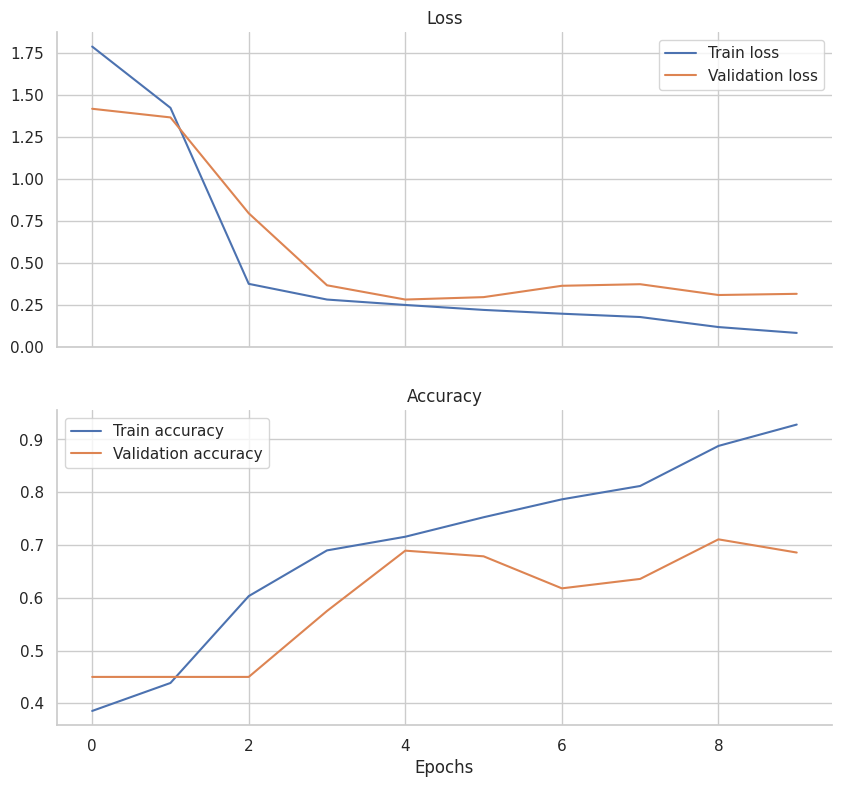

In [ ]:
# NO SMOTE
PlotGraph(history_warmup_RN50_1, history_finetunning_RN50_1)

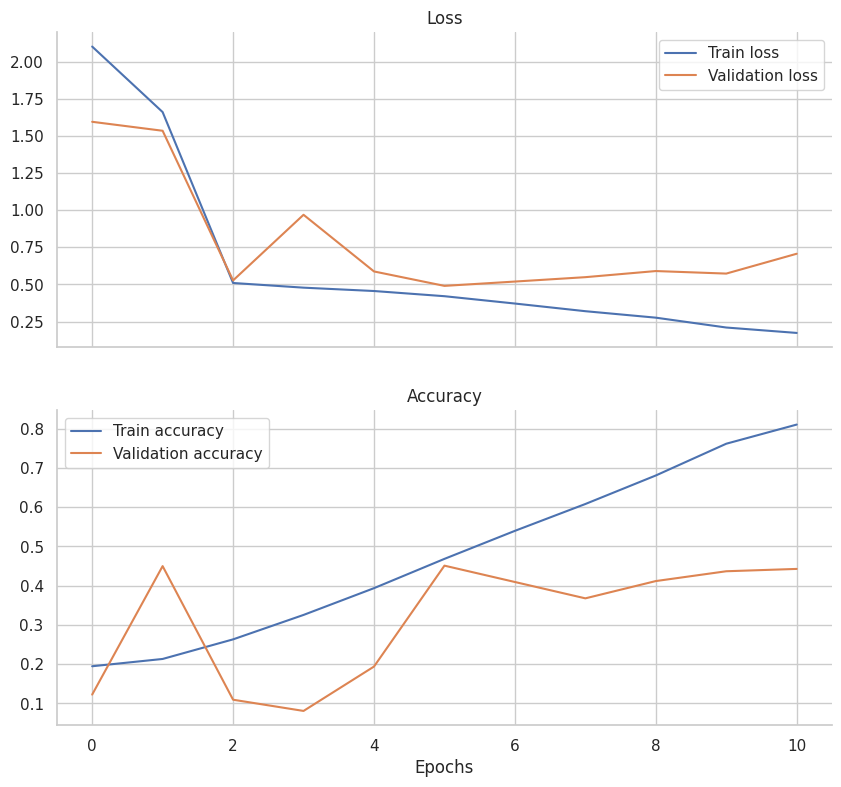

In [ ]:
# SMOTE
PlotGraph(history_warmup_RN50_1, history_finetunning_RN50_1)

## InceptionV3 Model

In [ ]:
model_InceptionV3_1 = CreateModelInceptionV3(input_shape=(HEIGHT, WIDTH, CHANNAL), n_out=N_CLASSES)
TrainTopLayers(model_InceptionV3_1)

Model: "model_6"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_7 (InputLayer)        [(None, 256, 256, 3)]        0         []                            
                                                                                                  
 conv2d_94 (Conv2D)          (None, 127, 127, 32)         864       ['input_7[0][0]']             
                                                                                                  
 batch_normalization_94 (Ba  (None, 127, 127, 32)         96        ['conv2d_94[0][0]']           
 tchNormalization)                                                                                
                                                                                                  
 activation_94 (Activation)  (None, 127, 127, 32)         0         ['batch_normalization_94

In [ ]:
history_warmup_InceptionV3 = FitTopLayers(model_InceptionV3_1)

Epoch 1/2


<ipython-input-108-6536cf3e8db0>:19: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  return model.fit_generator(generator=generator_for_train,


420/420 [==============================] - 14s 23ms/step - loss: 1.9821 - accuracy: 0.2318 - val_loss: 1.5200 - val_accuracy: 0.3964
Epoch 2/2
420/420 [==============================] - 8s 19ms/step - loss: 1.6169 - accuracy: 0.2417 - val_loss: 1.5333 - val_accuracy: 0.3869


In [ ]:
callback_list = FineTuneModel(model_InceptionV3_1)

Model: "model_6"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_7 (InputLayer)        [(None, 256, 256, 3)]        0         []                            
                                                                                                  
 conv2d_94 (Conv2D)          (None, 127, 127, 32)         864       ['input_7[0][0]']             
                                                                                                  
 batch_normalization_94 (Ba  (None, 127, 127, 32)         96        ['conv2d_94[0][0]']           
 tchNormalization)                                                                                
                                                                                                  
 activation_94 (Activation)  (None, 127, 127, 32)         0         ['batch_normalization_94

In [ ]:
history_finetunning_InceptionV3 = FitCompleteModel(model_InceptionV3_1, callback_list)

Epoch 1/30


<ipython-input-108-6536cf3e8db0>:38: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  return model.fit_generator(generator=generator_for_train,


420/420 [==============================] - 59s 73ms/step - loss: 0.5216 - accuracy: 0.2681 - val_loss: 0.4637 - val_accuracy: 0.4131 - lr: 1.0000e-04
Epoch 2/30
420/420 [==============================] - 26s 61ms/step - loss: 0.4811 - accuracy: 0.3277 - val_loss: 0.4620 - val_accuracy: 0.4321 - lr: 1.0000e-04
Epoch 3/30
420/420 [==============================] - 25s 61ms/step - loss: 0.4479 - accuracy: 0.4146 - val_loss: 0.4770 - val_accuracy: 0.4357 - lr: 1.0000e-04
Epoch 4/30
420/420 [==============================] - 25s 60ms/step - loss: 0.4208 - accuracy: 0.4661 - val_loss: 0.4758 - val_accuracy: 0.3798 - lr: 1.0000e-04
Epoch 5/30
420/420 [==============================] - ETA: 0s - loss: 0.3763 - accuracy: 0.5529
Epoch 5: ReduceLROnPlateau reducing learning rate to 4.999999873689376e-05.
420/420 [==============================] - 25s 61ms/step - loss: 0.3763 - accuracy: 0.5529 - val_loss: 0.4991 - val_accuracy: 0.3774 - lr: 1.0000e-04
Epoch 6/30
420/420 [=========================

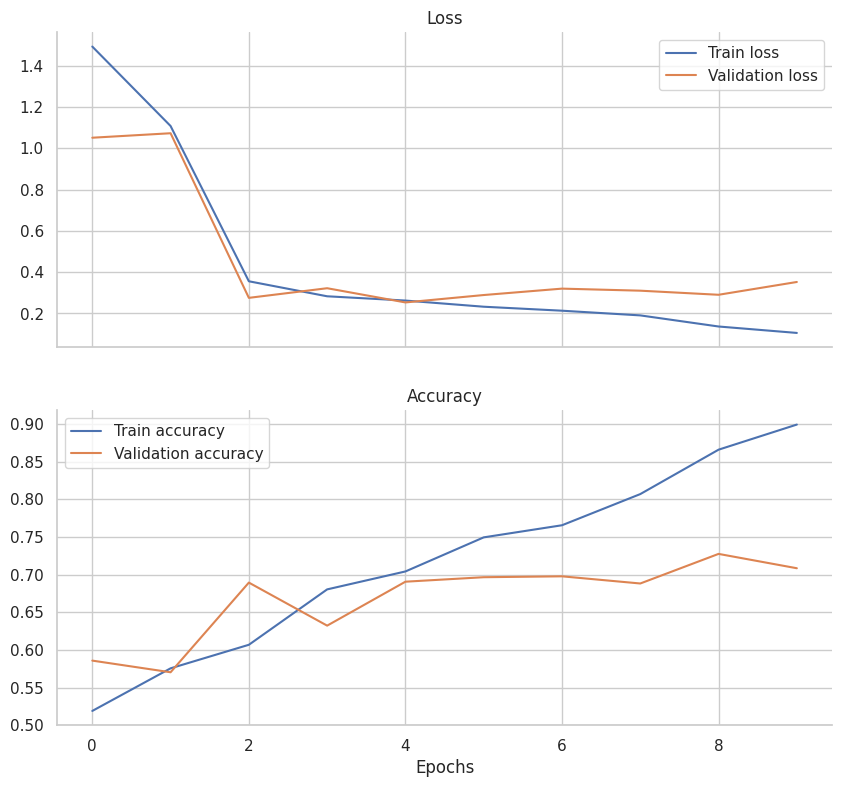

In [ ]:
# NO SMOTE
PlotGraph(history_warmup_InceptionV3, history_finetunning_InceptionV3)

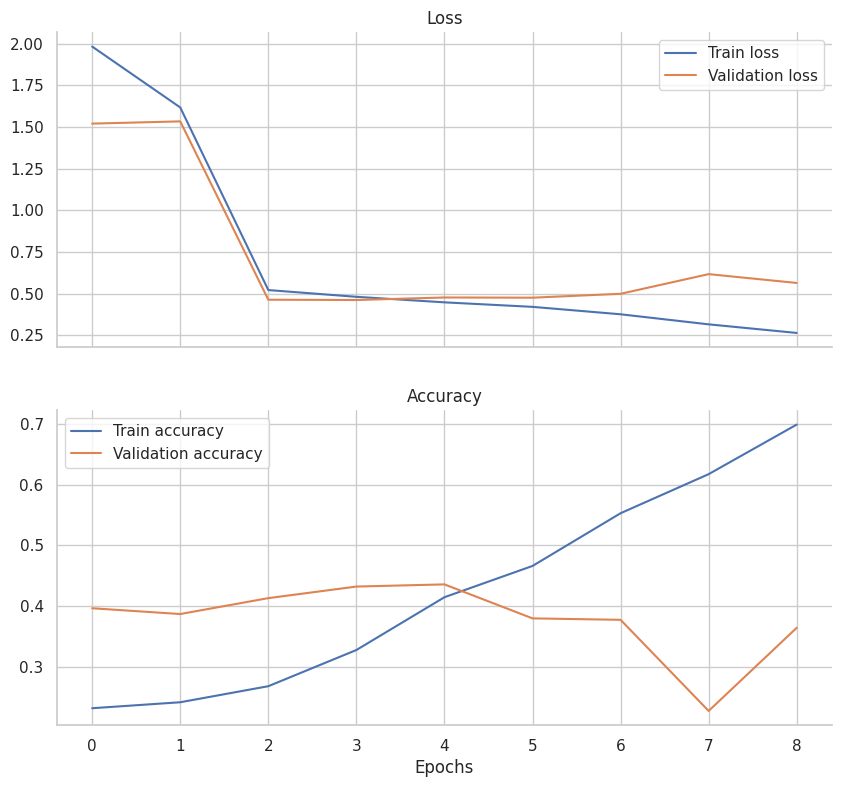

In [ ]:
# SMOTE
PlotGraph(history_warmup_InceptionV3, history_finetunning_InceptionV3)

## DenseNet169 Model

In [ ]:
model_DN169_1 = CreateModelDenseNet169(input_shape=(HEIGHT, WIDTH, CHANNAL), n_out=N_CLASSES)
TrainTopLayers(model_DN169_1)

Model: "model_7"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_8 (InputLayer)        [(None, 256, 256, 3)]        0         []                            
                                                                                                  
 zero_padding2d_2 (ZeroPadd  (None, 262, 262, 3)          0         ['input_8[0][0]']             
 ing2D)                                                                                           
                                                                                                  
 conv1/conv (Conv2D)         (None, 128, 128, 64)         9408      ['zero_padding2d_2[0][0]']    
                                                                                                  
 conv1/bn (BatchNormalizati  (None, 128, 128, 64)         256       ['conv1/conv[0][0]']    

In [ ]:
history_warmup_DN169 = FitTopLayers(model_DN169_1)

Epoch 1/2


<ipython-input-108-6536cf3e8db0>:19: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  return model.fit_generator(generator=generator_for_train,


420/420 [==============================] - 25s 37ms/step - loss: 2.0319 - accuracy: 0.2252 - val_loss: 1.4869 - val_accuracy: 0.3833
Epoch 2/2
420/420 [==============================] - 13s 31ms/step - loss: 1.6326 - accuracy: 0.2389 - val_loss: 1.6163 - val_accuracy: 0.3821


In [ ]:
callback_list = FineTuneModel(model_DN169_1)

Model: "model_7"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_8 (InputLayer)        [(None, 256, 256, 3)]        0         []                            
                                                                                                  
 zero_padding2d_2 (ZeroPadd  (None, 262, 262, 3)          0         ['input_8[0][0]']             
 ing2D)                                                                                           
                                                                                                  
 conv1/conv (Conv2D)         (None, 128, 128, 64)         9408      ['zero_padding2d_2[0][0]']    
                                                                                                  
 conv1/bn (BatchNormalizati  (None, 128, 128, 64)         256       ['conv1/conv[0][0]']    

In [ ]:
history_finetunning_DN169 = FitCompleteModel(model_DN169_1, callback_list)

Epoch 1/30


<ipython-input-108-6536cf3e8db0>:38: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  return model.fit_generator(generator=generator_for_train,


420/420 [==============================] - 139s 145ms/step - loss: 0.5214 - accuracy: 0.2458 - val_loss: 0.4839 - val_accuracy: 0.3476 - lr: 1.0000e-04
Epoch 2/30
420/420 [==============================] - 51s 121ms/step - loss: 0.4827 - accuracy: 0.3315 - val_loss: 0.4677 - val_accuracy: 0.4000 - lr: 1.0000e-04
Epoch 3/30
420/420 [==============================] - 51s 121ms/step - loss: 0.4621 - accuracy: 0.3693 - val_loss: 0.5671 - val_accuracy: 0.4488 - lr: 1.0000e-04
Epoch 4/30
420/420 [==============================] - 51s 121ms/step - loss: 0.4417 - accuracy: 0.4229 - val_loss: 0.5128 - val_accuracy: 0.3536 - lr: 1.0000e-04
Epoch 5/30
420/420 [==============================] - ETA: 0s - loss: 0.4064 - accuracy: 0.4790
Epoch 5: ReduceLROnPlateau reducing learning rate to 4.999999873689376e-05.
420/420 [==============================] - 51s 120ms/step - loss: 0.4064 - accuracy: 0.4790 - val_loss: 0.5401 - val_accuracy: 0.2679 - lr: 1.0000e-04
Epoch 6/30
420/420 [===================

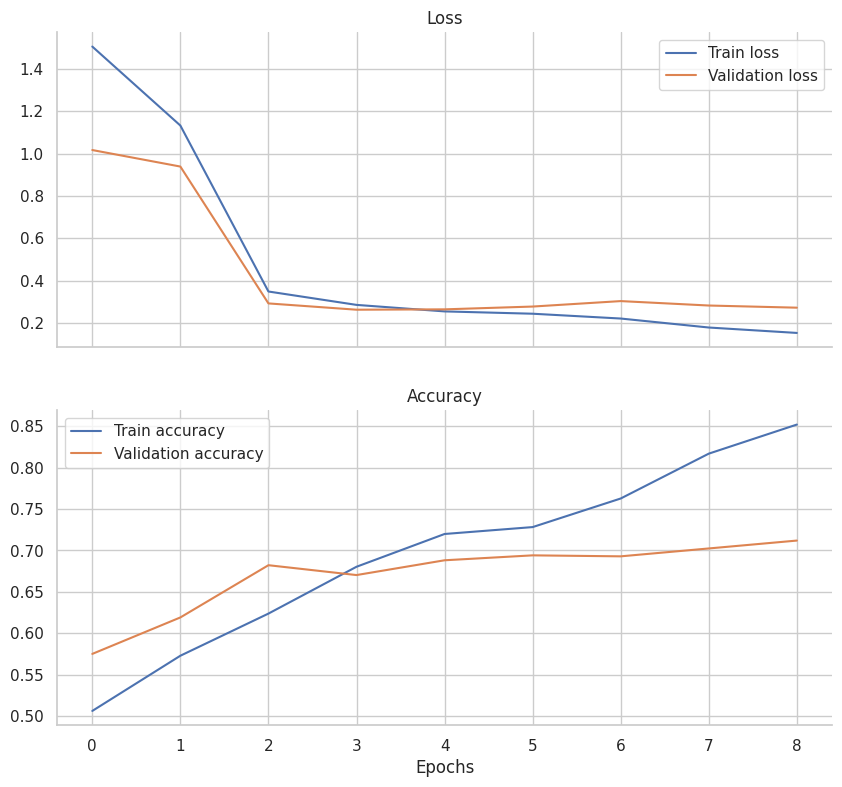

In [ ]:
# NO SMOTE
PlotGraph(history_warmup_DN169, history_finetunning_DN169)

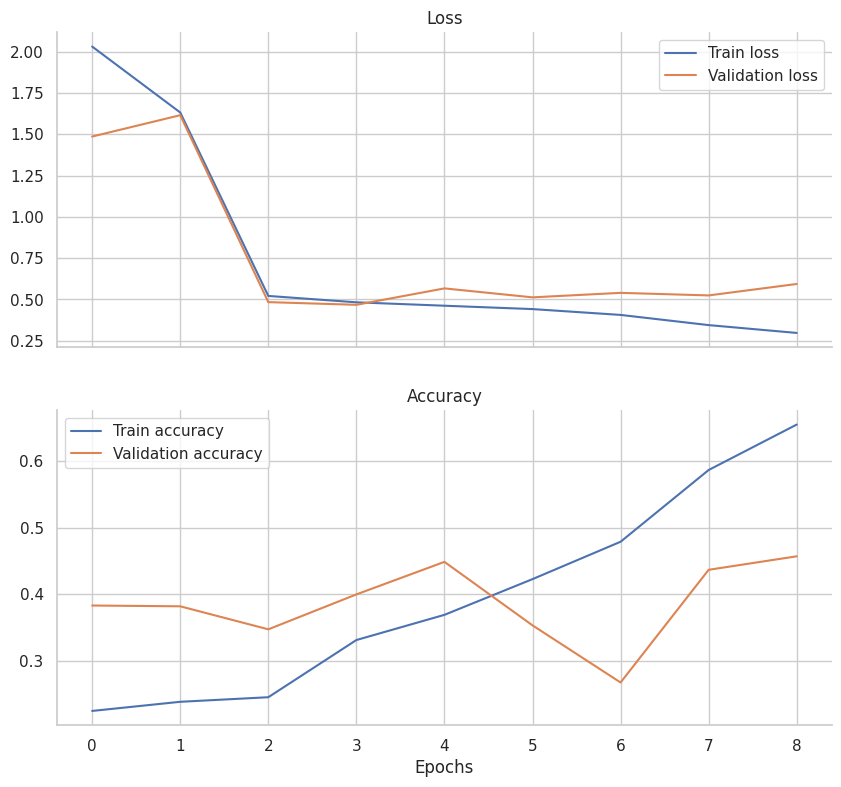

In [ ]:
# SMOTE
PlotGraph(history_warmup_DN169, history_finetunning_DN169)

## Evaluate Model

In [ ]:
complete_datagen = ImageDataGenerator(rescale=1./255)
complete_generator = complete_datagen.flow_from_dataframe(dataframe=df_train_train,
                                                          directory = "./train_images_resized_preprocessed/",
                                                          x_col="filename",
                                                          target_size=(HEIGHT, WIDTH),
                                                          batch_size=1,
                                                          shuffle=False,
                                                          class_mode=None)

def DisplayPredictScore(df, pred_class):
  ck_percentage = cohen_kappa_score(pred_class, df['diagnosis'].astype('int'), weights='quadratic') * 100
  acc_percentage = accuracy_score(df['diagnosis'].astype('int'),pred_class) * 100
  print(f"Train Cohen Kappa score: {ck_percentage:.2f} %")
  print(f"Train Accuracy score : {acc_percentage:.2f} %")

def EvalModel(model, generator, df):
  generator.reset()
  step_size = generator.n // generator.batch_size
  pred_val = model.predict_generator(generator, steps=step_size, verbose = 1)
  pred_class = [np.argmax(pred) for pred in pred_val]
  DisplayPredictScore(df, pred_class)
  return pred_class

def PlotConfMatrix(true, pred, classes):
  cnf_matrix = confusion_matrix(true, pred)
  df_cm = pd.DataFrame(cnf_matrix, range(len(classes)), range(len(classes)))
  plt.figure(figsize=(4, 2.75))
  sns.set(font_scale=1.4)
  sns.heatmap(df_cm, annot=True, annot_kws={"size": 16}, xticklabels = classes, yticklabels = classes, fmt='g', cmap="Blues")
  plt.show()

def PlotConfMatrixPercentage(true, pred, classes):
  cnf_matrix = confusion_matrix(true, pred)
  cnf_matrix_norm = cnf_matrix.astype('float') / cnf_matrix.sum(axis=1)[:, np.newaxis]
  df_cm = pd.DataFrame(cnf_matrix_norm, index = classes, columns = classes)
  plt.figure(figsize=(6, 2.5))
  sns.heatmap(df_cm, annot=True, fmt='.2f', cmap="Blues")
  plt.show()

def PlotMatrix(df, pred_class):
  test_actual_class = list(df['diagnosis'].astype(int))
  labels = ['0 - No DR', '1 - Mild', '2 - Moderate', '3 - Severe', '4 - Proliferative DR']
  PlotConfMatrix(test_actual_class, pred_class, labels)
  PlotConfMatrixPercentage(test_actual_class, pred_class, labels)

Found 3367 validated image filenames.


## Evaluate Model on Complete Train Data

In [ ]:
pred_train_class_RN_50_1 = EvalModel(model_RN50_1, complete_generator, df_train_train)

<ipython-input-25-c82d24853729>:19: UserWarning: `Model.predict_generator` is deprecated and will be removed in a future version. Please use `Model.predict`, which supports generators.
  pred_val = model.predict_generator(generator, steps=step_size, verbose = 1)


3367/3367 [==============================] - 31s 9ms/step
Train Cohen Kappa score: 99.91 %
Train Accuracy score : 99.85 %


In [ ]:
pred_train_class_InceptionV3 = EvalModel(model_InceptionV3, complete_generator, df_train_train)

<ipython-input-25-c82d24853729>:19: UserWarning: `Model.predict_generator` is deprecated and will be removed in a future version. Please use `Model.predict`, which supports generators.
  pred_val = model.predict_generator(generator, steps=step_size, verbose = 1)


3367/3367 [==============================] - 33s 9ms/step
Train Cohen Kappa score: 99.90 %
Train Accuracy score : 99.82 %


In [ ]:
pred_train_class_DN169 = EvalModel(model_DN169, complete_generator, df_train_train)

<ipython-input-25-c82d24853729>:19: UserWarning: `Model.predict_generator` is deprecated and will be removed in a future version. Please use `Model.predict`, which supports generators.
  pred_val = model.predict_generator(generator, steps=step_size, verbose = 1)


3367/3367 [==============================] - 59s 17ms/step
Train Cohen Kappa score: 99.91 %
Train Accuracy score : 99.85 %


## Evaluate Model on Test Data

In [ ]:
pred_test_class_RN50_1 = EvalModel(model_RN50_1, test_generator, test_retina_df)

  11/1968 [..............................] - ETA: 20s

<ipython-input-25-c82d24853729>:19: UserWarning: `Model.predict_generator` is deprecated and will be removed in a future version. Please use `Model.predict`, which supports generators.
  pred_val = model.predict_generator(generator, steps=step_size, verbose = 1)


1968/1968 [==============================] - 17s 9ms/step
Train Cohen Kappa score: 86.46 %
Train Accuracy score : 79.22 %


In [ ]:
pred_test_class_InceptionV3 = EvalModel(model_InceptionV3, test_generator, test_retina_df)

  10/1968 [..............................] - ETA: 22s

<ipython-input-25-c82d24853729>:19: UserWarning: `Model.predict_generator` is deprecated and will be removed in a future version. Please use `Model.predict`, which supports generators.
  pred_val = model.predict_generator(generator, steps=step_size, verbose = 1)


1968/1968 [==============================] - 18s 9ms/step
Train Cohen Kappa score: 85.57 %
Train Accuracy score : 78.20 %


In [ ]:
pred_test_class_DN169 = EvalModel(model_DN169, test_generator, test_retina_df)

   4/1968 [..............................] - ETA: 33s 

<ipython-input-25-c82d24853729>:19: UserWarning: `Model.predict_generator` is deprecated and will be removed in a future version. Please use `Model.predict`, which supports generators.
  pred_val = model.predict_generator(generator, steps=step_size, verbose = 1)


1968/1968 [==============================] - 33s 17ms/step
Train Cohen Kappa score: 86.59 %
Train Accuracy score : 79.52 %


================================= model_RN50 =================================


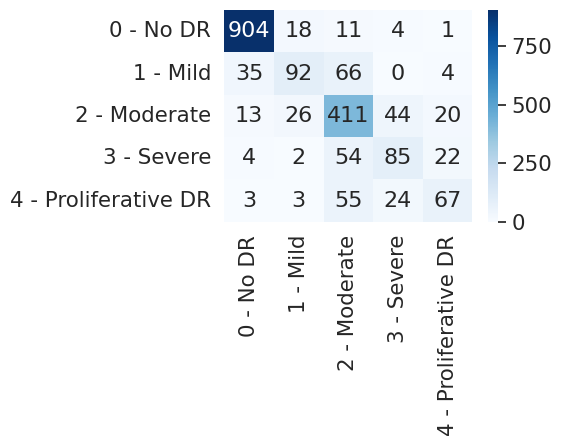

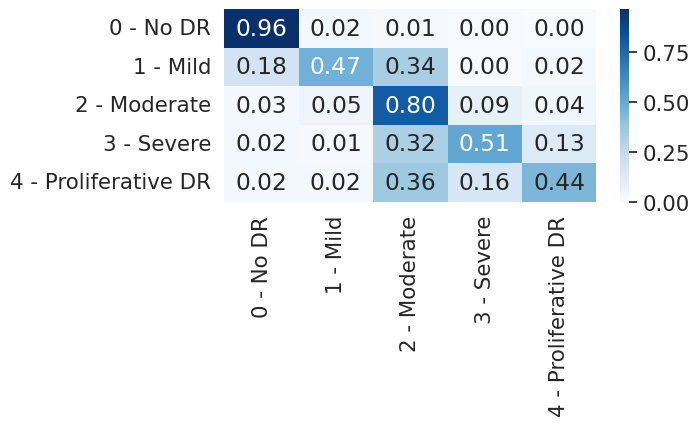

In [ ]:
print("================================= model_RN50 =================================")
PlotMatrix(test_retina_df, pred_test_class_RN50_1)

================================= model_InceptionV3 =================================


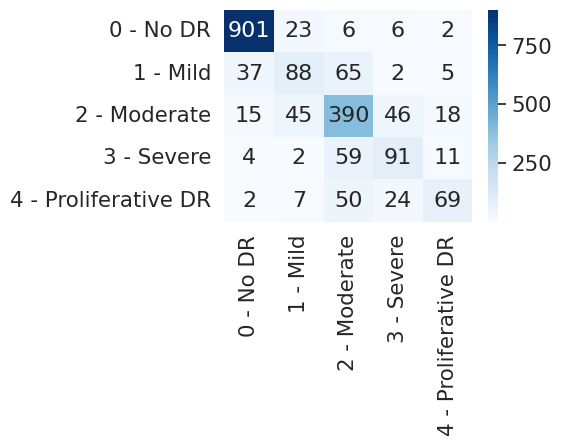

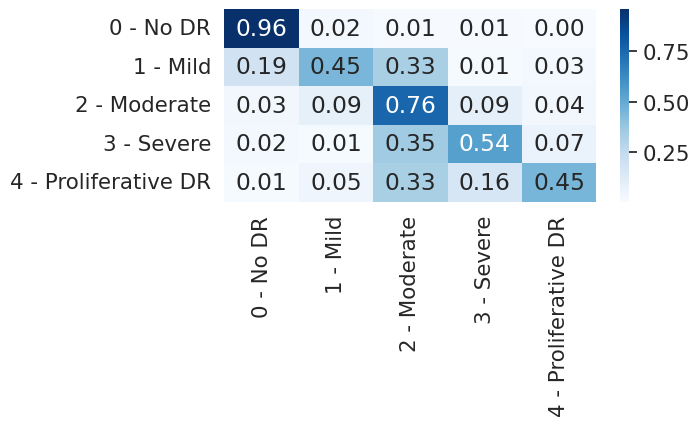

In [ ]:
print("================================= model_InceptionV3 =================================")
PlotMatrix(test_retina_df, pred_test_class_InceptionV3)

================================= model_DN169 =================================


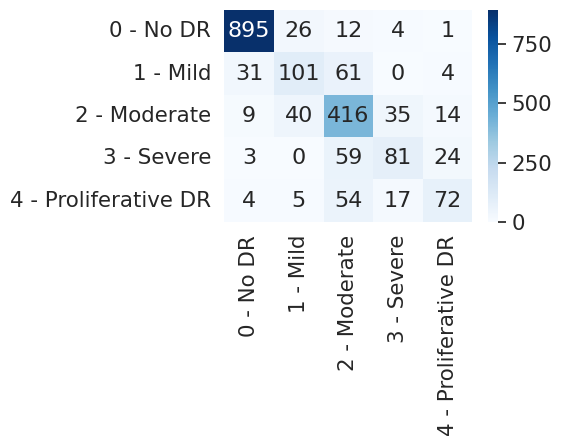

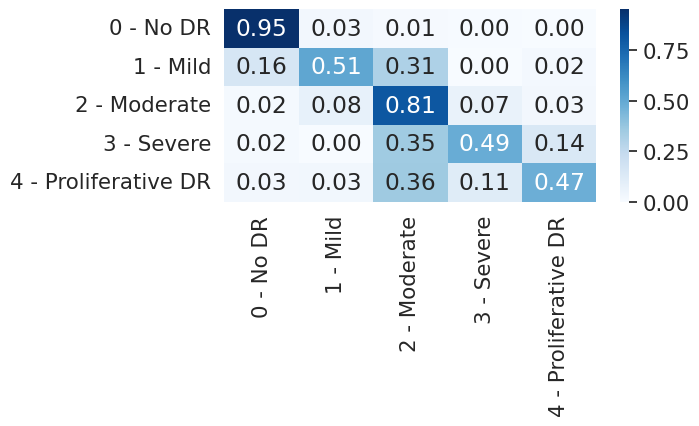

In [ ]:
print("================================= model_DN169 =================================")
PlotMatrix(test_retina_df, pred_test_class_DN169)

## Prediction by image

In [ ]:
labels = ['0 - No DR', '1 - Mild', '2 - Moderate', '3 - Severe', '4 - Proliferative DR']

def ShowImagePrediction(img, pred_class, actual_class=None):
  plt.figure(figsize = (3,3))
  img_bgr = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
  plt.imshow(img_bgr)
  title = f"I guess this is {labels[pred_class]}."
  if actual_class is not None:
    title = title + f"\n (The actual is {labels[actual_class]})"
  plt.title(title)
  plt.axis('off')
  plt.show()

def Predict(model, img):
  img_tmp = cv2.resize(img, (IMG_SIZE, IMG_SIZE))
  img_tmp = CircleCrop(img_tmp)
  img_tmp = img_to_array(img_tmp)
  img_tmp = np.expand_dims(img_tmp, axis=0)
  img_tmp = img_tmp / 255.0
  predicted = model.predict(img_tmp)
  predicted_class = np.argmax(predicted)
  return predicted_class

def TestImagePredExample(model, df, rows=2, cols=3):
  fig, axes = plt.subplots(rows, cols, figsize=(10, 10))
  for i, ax in enumerate(axes.flat):
    rn = np.random.randint(low = 0,high = len(test_retina_df) - 1)
    img_to_pred = cv2.imread(df['path'].iloc[rn])
    actual_class = int(df['diagnosis'].iloc[rn])
    pred_class = Predict(model, img_to_pred)
    ax.imshow(cv2.cvtColor(img_to_pred, cv2.COLOR_BGR2RGB))
    title = f"I guess this is {labels[actual_class]}.\n (The actual is {labels[pred_class]})"
    ax.set_title(title)
    ax.axis('off')
  plt.tight_layout()
  plt.show()

1/1 [==============================] - 0s 28ms/step


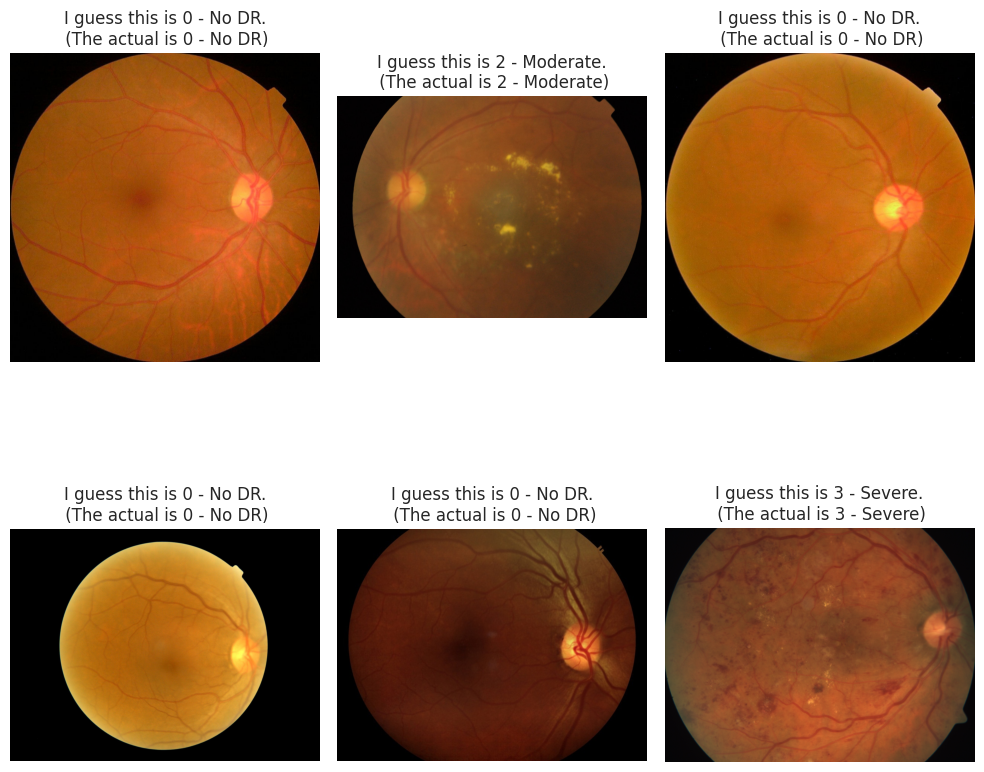

In [ ]:
TestImagePredExample(pred_test_class_DN169, df_retina_test)

1/1 [==============================] - 0s 27ms/step


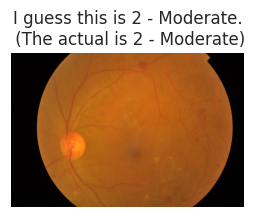

In [ ]:
random_number = np.random.randint(low = 0,high = len(test_retina_df) - 1)
img_to_pred = cv2.imread(test_retina_df['path'].iloc[random_number])
actual_class = int(test_retina_df['diagnosis'].iloc[random_number])
pred_class = Predict(pred_test_class_DN169, img_to_pred)
ShowImagePrediction(img_to_pred, pred_class, actual_class)

## Save / Load TF Model

In [ ]:
# def SaveTFModel(model, file_name): # Exlude type
#   # Assuming you have a TensorFlow model named 'model'
#   model_json = model.to_json()

#   # Save the model architecture in JSON format
#   with open(f"{file_name}.json", "w") as json_file:
#       json_file.write(model_json)

#   weights = [np.array(w) for w in model.get_weights()]

#   # Save weights to a binary file
#   with open(f"{file_name}_weights.bin", "wb") as binary_file:
#       for weight in weights:
#           binary_file.write(weight.tobytes())

# def LoadTFModel(file_name): # Exlude type
#   # Load Json
#   # Load the model architecture from the JSON file
#   with open(f"{file_name}.json", "r") as json_file:
#       loaded_model_json = json_file.read()

#   loaded_model = tf.keras.models.model_from_json(loaded_model_json)

#   # Load the weights into the model
#   with open(f"{file_name}_weights.bin", "rb") as bin_file:
#       for layer in loaded_model.layers:
#           if isinstance(layer, tf.keras.layers.BatchNormalization):
#               # For BatchNormalization layers, load gamma and beta
#               gamma_beta = np.fromfile(bin_file, dtype=np.float32, count=2 * layer.input_shape[-1])
#               gamma = gamma_beta[:layer.input_shape[-1]]
#               beta = gamma_beta[layer.input_shape[-1]:]
#               moving_mean = np.fromfile(bin_file, dtype=np.float32, count=layer.input_shape[-1])
#               moving_variance = np.fromfile(bin_file, dtype=np.float32, count=layer.input_shape[-1])

#               layer.set_weights([gamma, beta, moving_mean, moving_variance])
#           else:
#               # For other layers, load weights as usual
#               layer_weights = [np.fromfile(bin_file, dtype=np.float32, count=np.prod(param.shape)).reshape(param.shape)
#                               for param in layer.trainable_variables]
#               layer.set_weights(layer_weights)
#   return loaded_model

# SaveTFModel(model, "resnet50_79per")